# Star Detection and Centroid Localization 
## in highly electrical and luminous noise systems
<img src="cover.png" width="100%" height="auto">

## A brief introduction to our project


In this work, we build upon two recent approaches addressing complementary aspects of the star tracking problem. 
The first focuses on star detection, proposing image processing techniques aimed at improving robustness in the presence of noise and enhancing detection reliability ('Stars Detection and Localisation  Improvement Based on Image Processing', by Imène TALEB, Azzedine RACHEDI, Khadra BENAHMED). 

The second addresses star localization, introducing methods to improve centroid estimation accuracy under challenging conditions such as background interference and stray light.('High-Precision Centroid Localization Algorithm for Star Sensor Under Strong Straylight Condition', by Jindong Yuan, Junfeng Wu and Guohua Kang) 

Our project combines these two approaches, using detection strategies from the former and localization techniques from the latter, with the objective of improving the overall detection and localization statistics of the open-source star tracking software LOST.
This software is designed for small satellites, providing a complete pipeline for star detection, identification, and localization under limited computational resources.

To obtain a reliable ground truth for the dataset, the images used in this work, including the seven images presented in the following chapters, were generated using LOST. This approach allows controlled simulation of different sources of disturbance, such as electrical, luminous, and atmospheric noise. Moreover, image generation provides access to the exact number and true centroid positions of the stars, which are used as reference to evaluate the performance of the proposed star detection and localization methods with respect to LOST. After image generation, LOST was independently run on the same images for detection and localization, ensuring that the evaluation was performed on a case-by-case basis without exploiting prior knowledge of the simulated ground truth.

## Chapter 1: Star Detection

To correctly define a detection function we wil focus of three main cases: luminous noise, electric noise and motion-induced elongation.
The seven images that were selected to be a solid basis of our work represent these cases in different configurations, with each case potentially appearing in more than one image and being combined with the others.

Importing the libraries

In [1]:
import matplotlib.pyplot as plt
import cv2
import os
import math
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from skimage.feature import peak_local_max
from scipy.stats import norm
from scipy.spatial.distance import cdist
from scipy.stats import mode
import matplotlib.patches as mpatches
import utils
import pandas as pd

/Users/dree/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Installing skimage to compute peak local maxima

In [2]:
!pip install scikit-image

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.3 -> 26.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


Installing gdown to import the image repositories

In [3]:
!pip install gdown
import gdown

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.3 -> 26.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


Importing the repository with all the images on which we will work

In [4]:
path = os.getcwd()
print("Your current path", path)
files = os.listdir(path)
print("Files in the current directory:", files)

Your current path /Users/dree/Documents/GitHub/Star_Detection/project
Files in the current directory: ['star_detection.py', '.DS_Store', 'dataset', 'output.zip', 'Star_images', 'output', '__pycache__', '.gitignore', 'utils.py', 'Star_Tracking_final.ipynb', 'pipeline.py', 'perfect_image_algorithm.py', 'prova.py', 'cover.png', 'Star_images.zip']


Downloading the repository with the images

In [5]:
file_id = "1yGgAPiegBl9IBCPWQeXmOKNFGsyhw6MW"
url = f"https://drive.google.com/uc?id={file_id}"

output = "Star_images.zip"
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1yGgAPiegBl9IBCPWQeXmOKNFGsyhw6MW
To: /Users/dree/Documents/GitHub/Star_Detection/project/Star_images.zip
100%|██████████| 6.10M/6.10M [00:00<00:00, 42.7MB/s]


'Star_images.zip'

Unzipping the repository

In [6]:
import zipfile

with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall(".")   # "." = cartella corrente
print("The repository has been unzipped successfully.")

The repository has been unzipped successfully.


Checking the images we have downloaded

In [7]:
image_path = "./Star_images"
# Elenco di tutti i file immagine (jpg, png, ecc.)
files = [f for f in os.listdir(image_path) if f.lower().endswith(('.png'))]
files.sort()

print(f"{len(files)} images founded:")
for f in files:
    print("-", f)

8 images founded:
- 0_perfect_annotation.png
- 1 perfect.png
- 2 zero_noise.png
- 3 little_noise.png
- 4 more_noise.png
- 5 dark_current.png
- 6 blur.png
- 7 blurr_current_noise.png


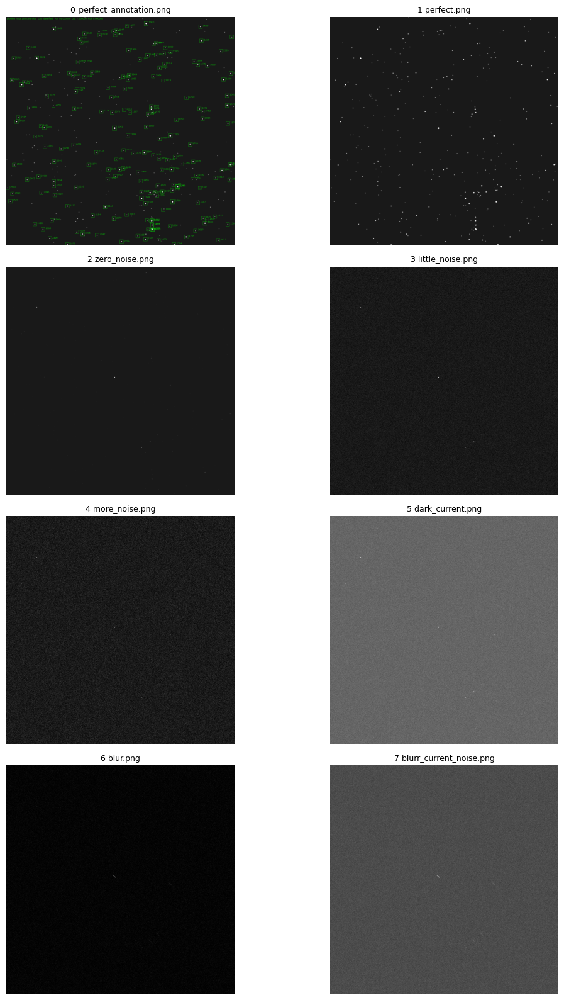

In [8]:
cols = 2  # images per line
rows = math.ceil(len(files) / cols)

plt.figure(figsize=(12, 4 * rows))

for i, file in enumerate(files):
    img = cv2.imread(os.path.join(image_path, file))

    if img is None:
        raise FileNotFoundError(f"Image not found or failed to load: {image_path}")


    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(file, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()


These images are examples of all the possible case scenarios that are taken into account in the whole dataset on which we'll be working on after the algorithm for star detection is set.
The idea is to work on each different case, building a layered algorithm that can adapt to each possible case.

We start with a simple grey level analisis to understand the initial situation.

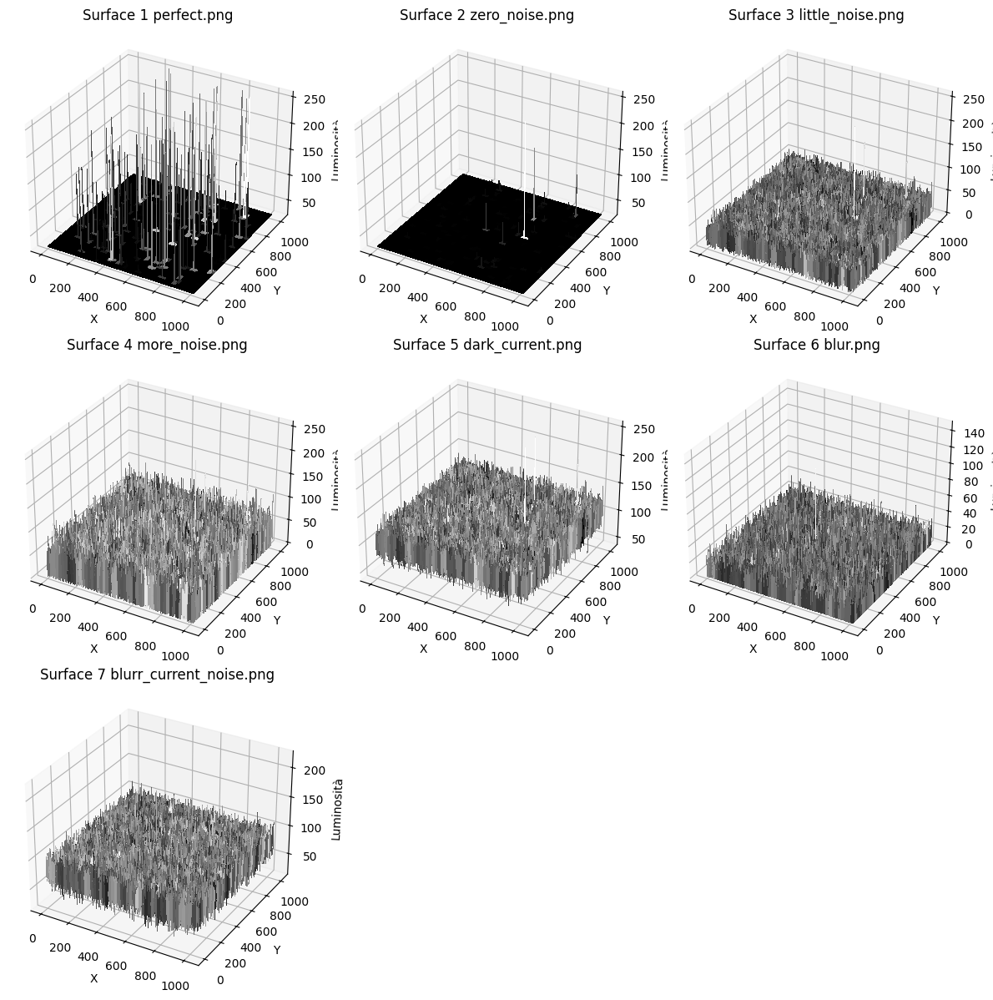

In [9]:
#Saving the greyscales for future uses
greyscales = []

cols = 3
rows = math.ceil(len(files) / cols)

fig = plt.figure(figsize=(12, 4 * rows))

plot_index = 1 

for i, file in enumerate(files):
    img = cv2.imread(os.path.join(image_path, file))

    if img is None:
        raise FileNotFoundError(f"Image not found or failed to load: {image_path}")
    elif  i == 0:
        continue

    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    greyscales.append(gray_img)

    # Getting dimensions
    H, W = gray_img.shape

    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = gray_img

    # Creating 3D plot
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1

    ax.plot_surface(X, Y, Z, cmap='gray', linewidth=0, antialiased=False)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Surface {file}")

plt.tight_layout()
plt.show()


As noticible the first two cases, with zero noise, present quite a clear graph of level of grey, from which it is easy to distinguish among the background and the stars.
In this two cases we would only need to set a threshold above which every luminous peak would represent a star.

To set this threshold we can draw a cumulative histogram for grey levels and choose the value from which less and less pixel assume that level of grey

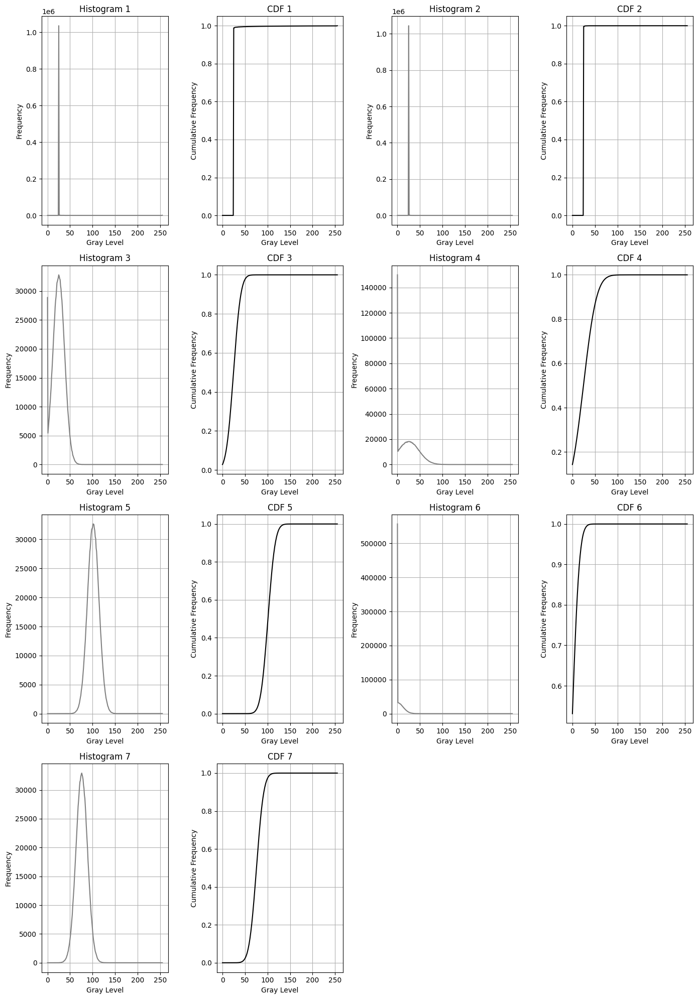

In [10]:
# Histogram and CDF plots for each greyscale image
cols = 2                     
rows = math.ceil(len(greyscales) / cols)

# Each image will have two plots: histogram + CDF
fig = plt.figure(figsize=(14, 5 * rows))

plot_index = 1

for i, img in enumerate(greyscales):

    # Histogram
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # Cumulative Histogram
    cum_hist = hist.cumsum()
    cum_hist_norm = cum_hist / cum_hist[-1]   # normalized (0–1)

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, cols * 2, plot_index)   # two columns per image
    plot_index += 1

    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

    # --- CUMULATIVE HISTOGRAM (CDF) ---
    ax2 = fig.add_subplot(rows, cols * 2, plot_index)
    plot_index += 1

    ax2.plot(cum_hist_norm, color='black')
    ax2.set_title(f"CDF {i + 1}")
    ax2.set_xlabel("Gray Level")
    ax2.set_ylabel("Cumulative Frequency")
    ax2.grid(True)

plt.tight_layout()
plt.show()


We know that in star images most of the image is taken by the background, with a very low percentage of pixel representing stars.
For this reason we expect the low level of grey to have the biggest number of pixel.
This is exactly what happens in each graph, with the difference of graphs like the gaussian one that warns about the presence of some kind of noise.

For the moment we start from the basis of our algorithm and we set a threshold where the gray level value has taken more than the 80% of the pixels.
We will after refine this threshold and update resolution for each and every case.

Rilevati 312 picchi nell'immagine 1
Rilevati 312 picchi nell'immagine 2
Rilevati 9021 picchi nell'immagine 3
Rilevati 8797 picchi nell'immagine 4
Rilevati 9041 picchi nell'immagine 5
Rilevati 9041 picchi nell'immagine 6
Rilevati 9050 picchi nell'immagine 7


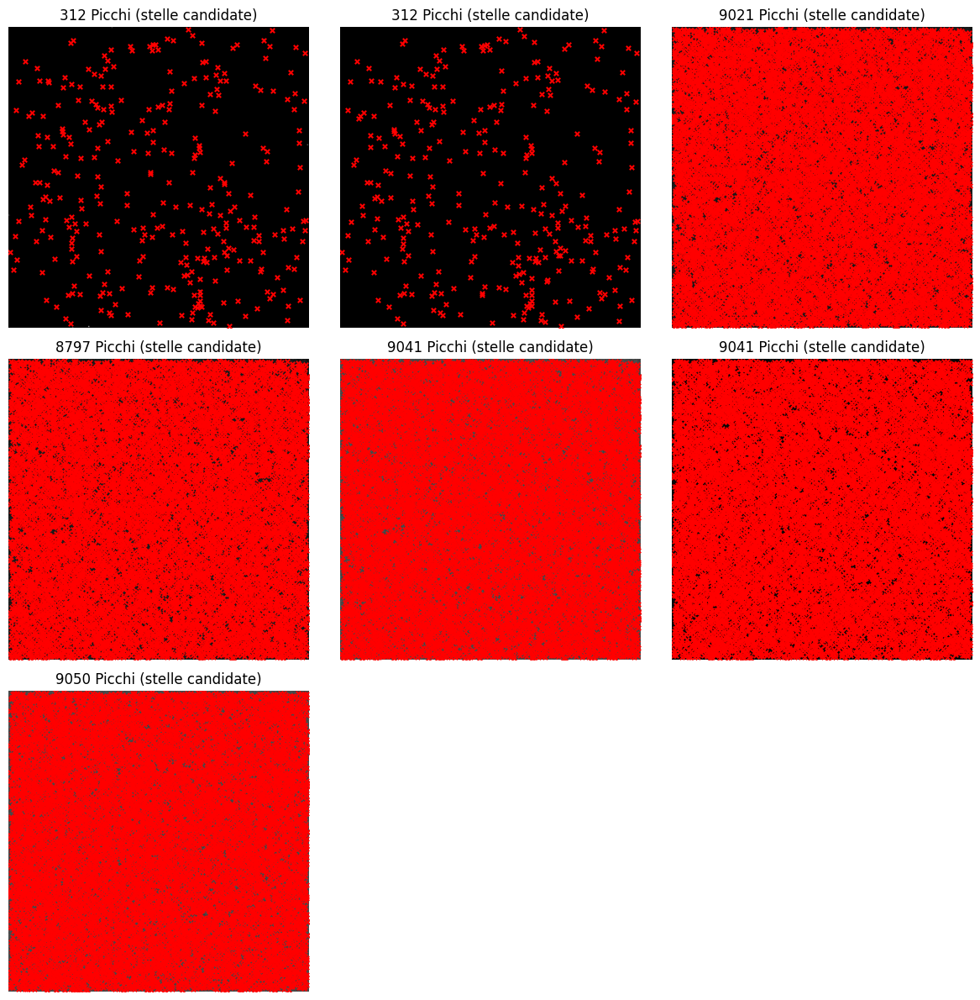

In [11]:
cols = 3
rows = math.ceil(len(greyscales) / cols)

fig = plt.figure(figsize=(12, 4 * rows))

plot_index = 1 

for i, img in enumerate(greyscales):

    threshold = np.percentile(img, 80)

    # Detecting peaks distant at least 5 pixels and above the threshold
    coordinates = peak_local_max(img, min_distance=5, threshold_abs=threshold)
    print(f"Rilevati {len(coordinates)} picchi nell'immagine {i + 1}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    plt.scatter(coordinates[:, 1], coordinates[:, 0], c='red',  s=15, marker='x')
    plt.title(f"{len(coordinates)} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


As it is is visible using the threshold computed in this way is optimal for the first two cases, but for the rest of the cases we need to add some more information in order to create new conditions in the algorithm.
Notice that the reason for which we say that computing local peaks works on image 1 and 2 is that in those cases we have zero or close to zero noise, meaning that everything above the background value is an object, or in our case, a star.
This is well visible from the greylevels 3d plot and from the histograms.

Let's now focus on the images 3, 4, 5, all depicting an increasing noise

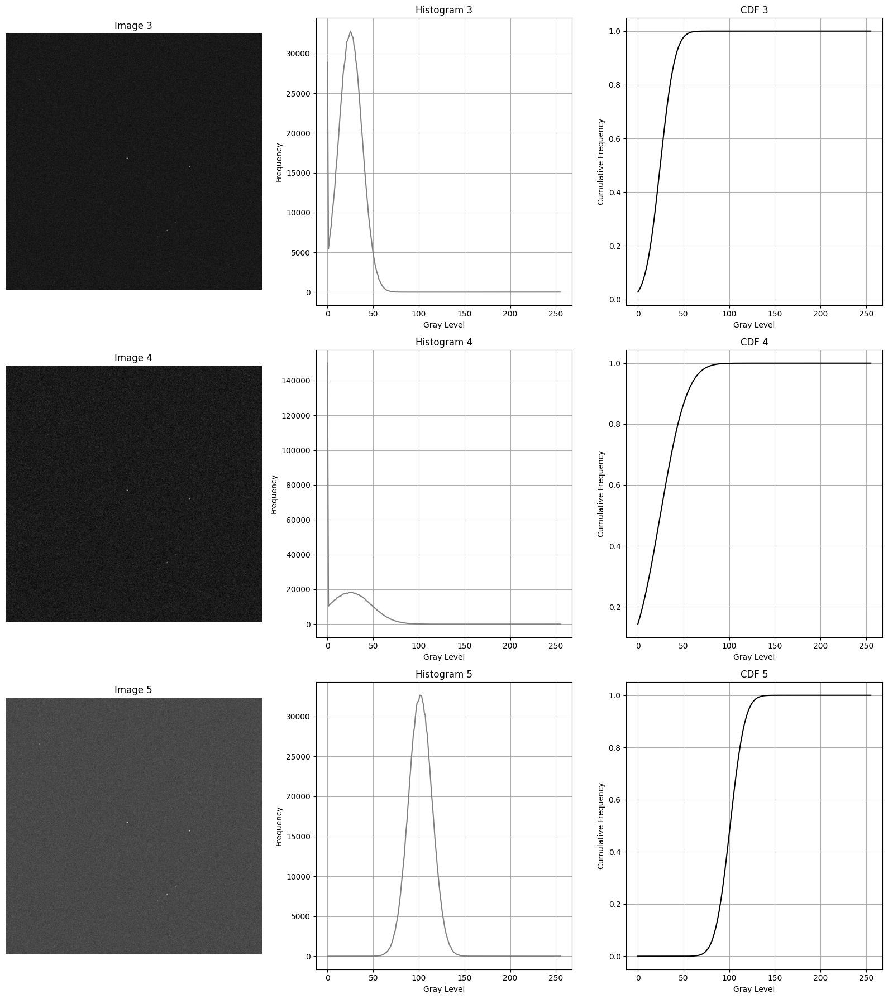

In [12]:
cols = 1                      
rows = 3                      

fig = plt.figure(figsize=(16, 6 * rows))
plot_index = 1

for i, img in enumerate(greyscales):

    if i < 2 or i > 4:
        continue  # keeping only images 2, 3, and 4

    # --- HISTOGRAM ---
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # --- CDF ---
    cum_hist = hist.cumsum()
    cum_hist_norm = cum_hist / cum_hist[-1]

    # --- IMAGE ---
    ax0 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax0.imshow(img, cmap='gray')
    ax0.set_title(f"Image {i + 1}")
    ax0.axis('off')

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

    # --- CDF ---
    ax2 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax2.plot(cum_hist_norm, color='black')
    ax2.set_title(f"CDF {i + 1}")
    ax2.set_xlabel("Gray Level")
    ax2.set_ylabel("Cumulative Frequency")
    ax2.grid(True)

plt.tight_layout()
plt.show()


We can see that in the three pictures above the noise is increasing and extending in the shades of grey.
If in the first case, the histogram reveals a peak of the noise in the small range of 20-40, in the other cases the noise is generally more distributed.
While with the image 3, streching the level of grey in which the density of pixel is limited would bring to better results, in the other two cases, it would amplify also the noise, leading to worse results. For this reason, we will first study the nature and the model describing the noise, to then stretch the grey levels of the denoised image. 

In a denoised image we would have an histogram representing a very strict peak in between the values 0 and 40, which is more or less the grey level of the background. In our case, we have experimented with completely denoised pictures with a background peak around the 25-26 value. We will start from this information to compute the model of the noise

We have four kind of noise in our images:
- The Read/Electrical noise(Gaussian): Widens the histogram around the values of the background
- The Shot noise(Poisson): Given by the light of the stars, it is very small and affects only the pixels near the stars
- The Dark Current noise (Exponential/Poisson): Distributed along the whole image and generated by the fact that each pixel generates a small difference of dark current
- The Quantization noise: here negligible

Because the shot and the quantization noise are negligible in our images, we can say that the image composition is structured in the following way:

Image = Background + ReadNoise + DarkNoise + Stars

Where Background≈25−26, ReadNoise ∼N(0,σ^2) and DarkNoise is a slow-varying offset.

Let's start by computing the ReadNoise variance

In [13]:
def estimate_sigma(image):
    median_val = np.median(image)
    mad = np.median(np.abs(image - median_val))
    sigma = 1.4826 * mad   # converts MAD to std for Gaussian
    return sigma

In [14]:
sigma_estimates = [] #for images 3, 4, 5

noise_images = [greyscales[2], greyscales[3], greyscales[4]]

for i, img in enumerate(noise_images):
    sigma_est = estimate_sigma(img)
    sigma_estimates.append(sigma_est)
    print(f"Estimated noise sigma for image {i + 3}: {sigma_est:.2f}")


Estimated noise sigma for image 3: 13.34
Estimated noise sigma for image 4: 23.72
Estimated noise sigma for image 5: 13.34


Even though it might sound strange that for two very different kind of images we have two similar values in variance, we have to better look at the histogram distribution. While the gaussian is moved to the left side, its "amplitude" remains quite similar. For the image4 instead, the gaussian is quite wider even though it stays shorter.

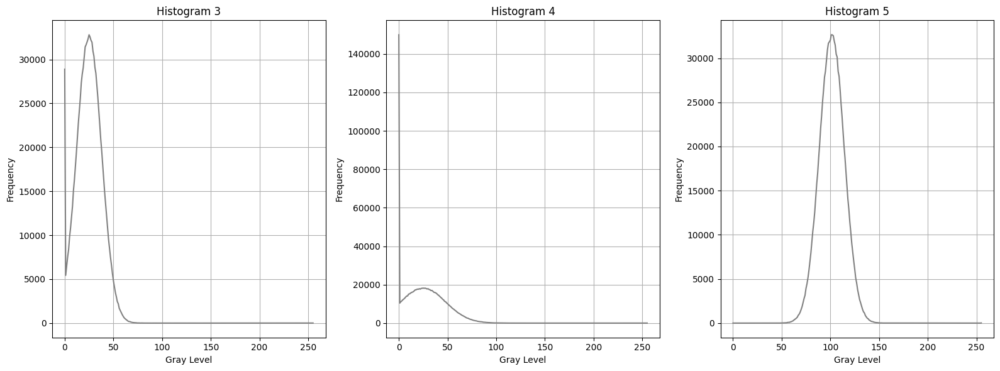

In [15]:
cols = 3                      
rows = 1                     

fig = plt.figure(figsize=(16, 6 * rows))
plot_index = 1

for i, img in enumerate(greyscales):

    if i < 2 or i > 4:
        continue  

    # --- HISTOGRAM ---
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # --- HISTOGRAM ---
    ax1 = fig.add_subplot(rows, 3, plot_index)
    plot_index += 1
    ax1.plot(hist, color='gray')
    ax1.set_title(f"Histogram {i + 1}")
    ax1.set_xlabel("Gray Level")
    ax1.set_ylabel("Frequency")
    ax1.grid(True)

plt.tight_layout()
plt.show()

Now, we have said that we have some gaussian noise, but then what are the high peak at the very low level in the first two histogram, and how should we work with them?
This peaks are given by the clipping. Clipping occurs when preprocessing produces negative pixel values, which are forced to 0 in the digital representation. This creates an artificial spike at low intensities (0-10 range) but it does not represent physical noise, so we can ignore it when estimating the background.


What we need to do now is to align the peak of the gaussian to where the denoised background peak is located, which is around the value of 25 value (this is true for every star detection image).

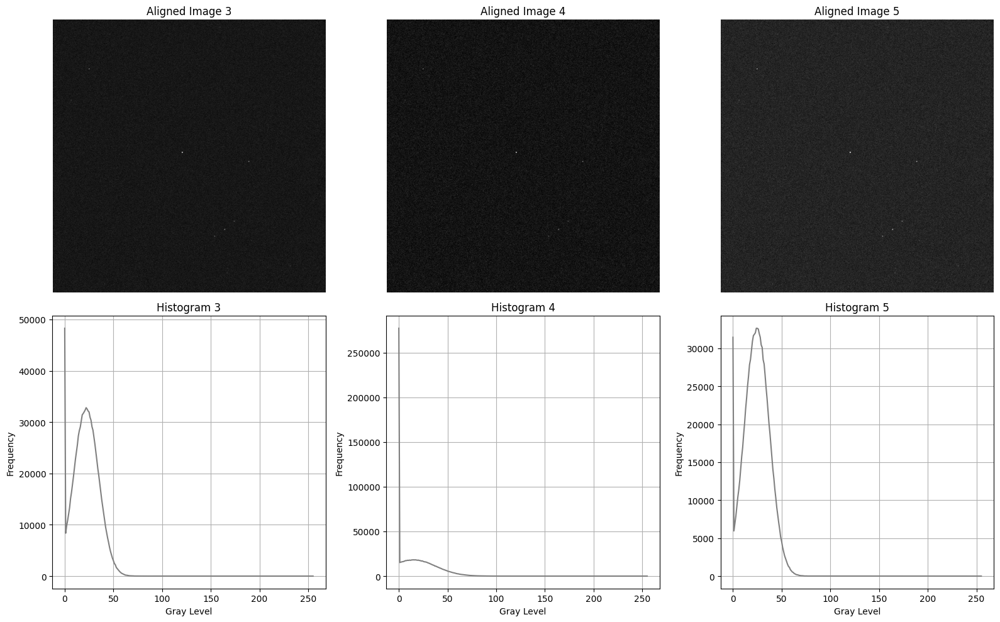

In [16]:
#Computing the safe range and fitting Gaussian to the histograms 
safe_lower = 10 #clipping value to avoid low-intensity noise

imges_safe = []

for img in noise_images:
    img_safe = img[(img >= safe_lower)]
    imges_safe.append(img_safe)

#Fitting the gaussians
mu_s = []
sigma_s = []
for img_safe in imges_safe:
    mu, sigma = norm.fit(img_safe)
    mu_s.append(mu)
    sigma_s.append(sigma)


denoised_peak = 25.5

delta_s = []

for mu in mu_s:
    delta = denoised_peak - mu
    delta_s.append(delta)

#Aligning the images

aligned_images = []
for i, img in enumerate(noise_images):
    delta = delta_s[i]
    img_aligned = np.clip(img + delta, 0, 255)
    aligned_images.append(img_aligned)

titles = ["Aligned Image 3", "Aligned Image 4", "Aligned Image 5"]

# Computing histograms of aligned images

histograms = [
    np.histogram(aligned_images[0].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images[1].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images[2].flatten(), bins=256, range=[0, 256])[0]
]

# Plotting the results
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# --- Row 1: Images ---
for i in range(3):
    axes[0, i].imshow(aligned_images[i], cmap='gray')
    axes[0, i].set_title(titles[i])
    axes[0, i].axis('off')

# --- Row 2: Histograms ---
for i in range(3):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+3}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()


The next step is to make the gaussian variance smaller and smaller in order to reduce the noise. To do this we are going to use the Wavelet thresholding, which means that we are going to shrink the small coefficients in detail bands

We use the soft thresholding , in order to preserve the stars' large coefficients

$$
c' =
\begin{cases}
0, & \text{if } |c| < T \\
c - T \cdot \operatorname{sign}(c), & \text{if } |c| \ge T
\end{cases}
$$

For the Gaussian noise we can simply choose a threshold of 

$$
T = 3\sigma
$$

In [17]:
!pip install PyWavelets
import pywt

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.3 -> 26.0
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [18]:
def wavelet_denoise(img, sigma, wave='db2', level=3, k=3):
    # Wavelet decomposition
    coeffs = pywt.wavedec2(img, wave, level=level)

    # Threshold based on noise
    T = k * sigma

    # Process detail coefficients (skip approximation coeffs[0])
    coeffs_thresh = [coeffs[0]]  # keep the approximation untouched

    for detail_level in coeffs[1:]:
        cH, cV, cD = detail_level
        cH = pywt.threshold(cH, T, mode='soft')
        cV = pywt.threshold(cV, T, mode='soft')
        cD = pywt.threshold(cD, T, mode='soft')
        coeffs_thresh.append((cH, cV, cD))

    # Reconstruct denoised image
    denoised = pywt.waverec2(coeffs_thresh, wave)
    return np.clip(denoised, 0, 255).astype(np.uint8)

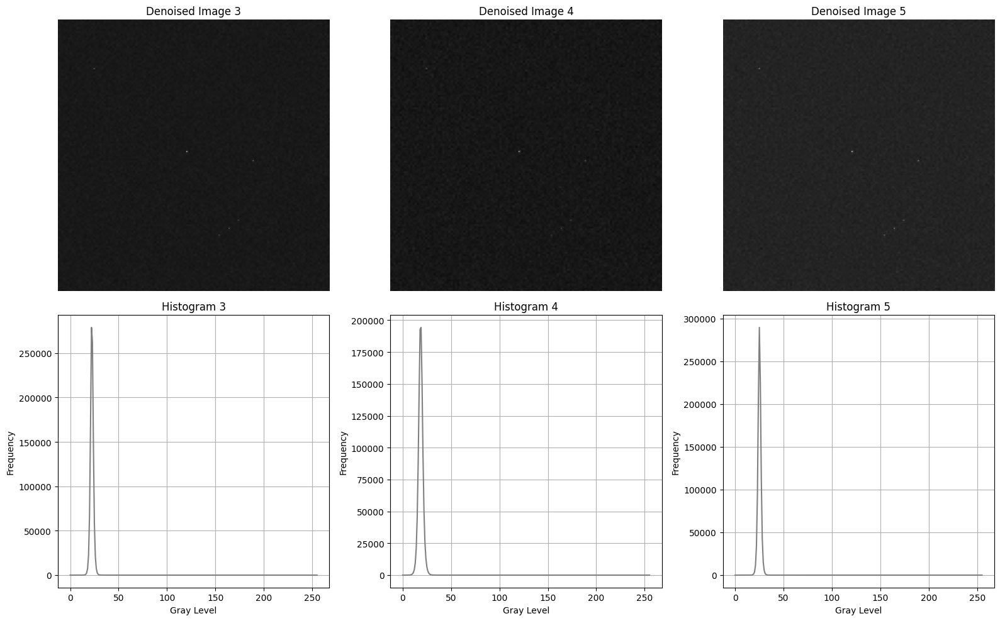

In [19]:
denoised_images = []

for i, img in enumerate(aligned_images):
    sigma = sigma_estimates[i]
    denoised_img = wavelet_denoise(img, sigma)
    denoised_images.append(denoised_img)

titles = ["Denoised Image 3", "Denoised Image 4", "Denoised Image 5"]

#Computing histograms of denoised images
histograms = [
    np.histogram(denoised_images[0].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(denoised_images[1].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(denoised_images[2].flatten(), bins=256, range=[0, 256])[0]
]

# Plotting the results
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Images
for i in range(3):
    axes[0, i].imshow(denoised_images[i], cmap='gray')
    axes[0, i].set_title(titles[i])
    axes[0, i].axis('off')

# Histograms
for i in range(3):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+3}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()


While the gaussians are stricter, also the clipping disappears because tha background alignment deletes the negative values while the wavelet denoising reduces the variance, avoiding the generation of pixel with negative or very low values.

we can now compare grey levels 3d plots, before and after tuning, in order to better check images improvements.

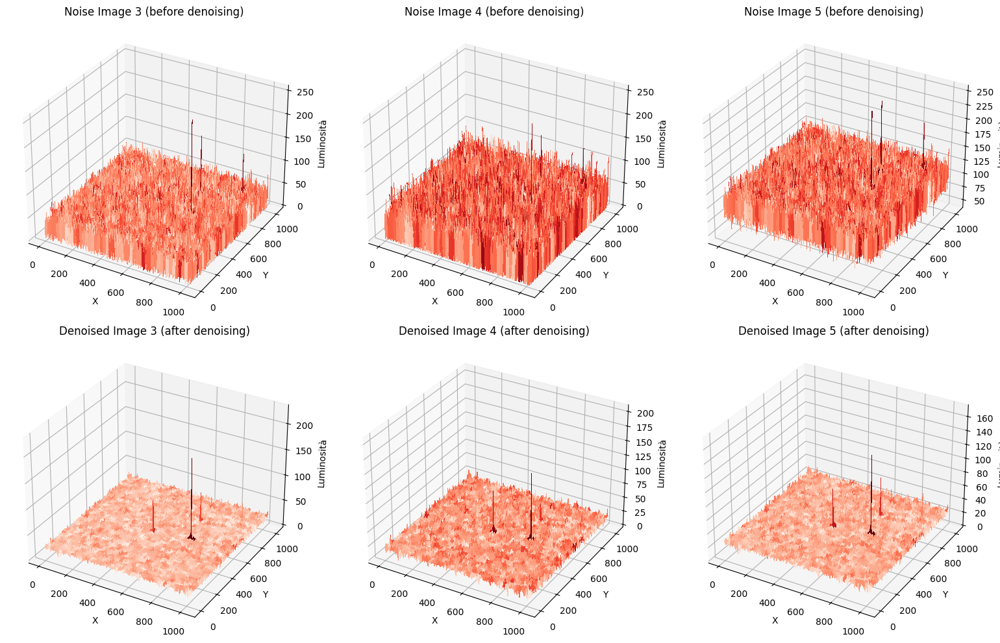

In [20]:
cols = 3
rows = 2

fig = plt.figure(figsize=(16, 10))

plot_index = 1

# 3D Surface noise_images 
for i, img in enumerate(noise_images):
    H, W = img.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = img
    
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1
    
    ax.plot_surface(X, Y, Z, cmap='Reds', linewidth=0, antialiased=False)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Noise Image {i + 3} (before denoising)")

# 3D Surface dei denoised_images 
for i, img in enumerate(denoised_images):
    H, W = img.shape
    X, Y = np.meshgrid(np.arange(W), np.arange(H))
    Z = img
    
    ax = fig.add_subplot(rows, cols, plot_index, projection='3d')
    plot_index += 1
    
    ax.plot_surface(X, Y, Z, cmap='Reds', linewidth=0, antialiased=False)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Luminosità')
    ax.set_title(f"Denoised Image {i + 3} (after denoising)")

plt.tight_layout()
plt.show()


As we can see, the larger stars are more visible, but the rest of the image looks a bit “flattened.”
This effect comes from the use of filters: it can be reduced but not completely removed.
Luckily, this is not a big problem for us, because the stars we want to detect have a Gaussian shape, and by filtering through a Gaussian we keep the stars Gaussian shape.
So even if the stars look smaller after filtering, we only need to detect the “Gaussian-like” changes in the image to find them. Their exact size is not very important once we set a threshold for the difference in brightness levels.

### Star detection main function

To write a correct function for star detection we need to move with small steps, starting from a basic idea and making it more and more precise by working on parameters and thresholds.
The main idea behind star detection is "scanning" the image with a window of a certain size and checking for stars by looking at the variations contained in that window each time we move it.

However, to better analyze variations within the window is very useful to use an inner one. By using two windows instead of one we can simplify computation, going from data modeling two simple mean comparison. While the first might be more precise, it is quite difficult to implement due to its high computational cost and the "flattening" of the image after the filtering.
For this reason our base detection function is a nested windows based one.

In [21]:
def detect_stars_nested_base(img, A_size=3, B_size=7, th_mean=2, th_std=1):
    rA = A_size // 2
    rB = B_size // 2

    H, W = img.shape
    stars = []

    for y in range(rB, H - rB):
        for x in range(rB, W - rB):

            A = img[y - rA : y + rA + 1, x - rA : x + rA + 1]
            B = img[y - rB : y + rB + 1, x - rB : x + rB + 1]

            center = img[y, x]

            # Condition 1: center is max of A
            if center != np.max(A):
                continue

            mean_A = np.mean(A)
            mean_B = np.mean(B)
            if mean_A <= mean_B + th_mean:
                continue

            var_A = np.var(A)
            var_B = np.var(B)
            if var_A <= var_B + th_std:
                continue

            stars.append((x, y))

    return stars


Rilevati 6 picchi nell'immagine 3
Rilevati 4 picchi nell'immagine 4
Rilevati 6 picchi nell'immagine 5


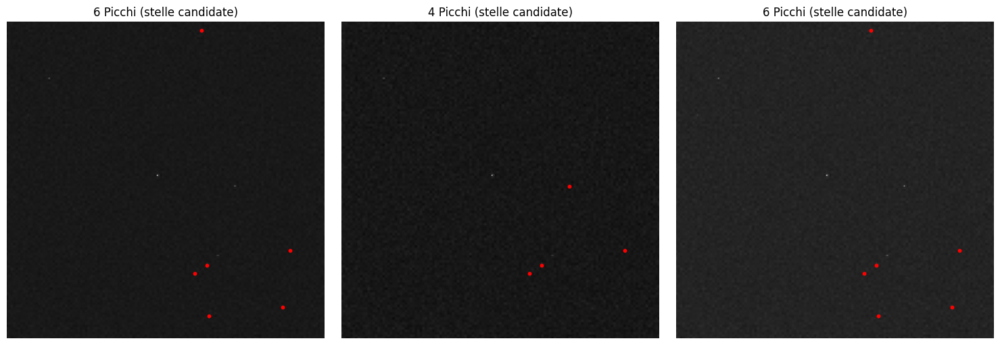

In [22]:
cols = 3
rows = 1

stars_nested = [None] * len(denoised_images)

fig = plt.figure(figsize=(15, 5))

for i, img in enumerate(denoised_images):
    
    stars_nested[i] = detect_stars_nested_base(img)
    print(f"Rilevati {len(stars_nested[i])} picchi nell'immagine {i + 3}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_nested[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_nested[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


As it is visible this basic function is not too performative, as it takes time to elaborate the images and it is not capable to detect stars that are visible to the eye. To understand how to correctly adjust the function for better performances, it is a good approach to test it with different parameters and analyse the different results

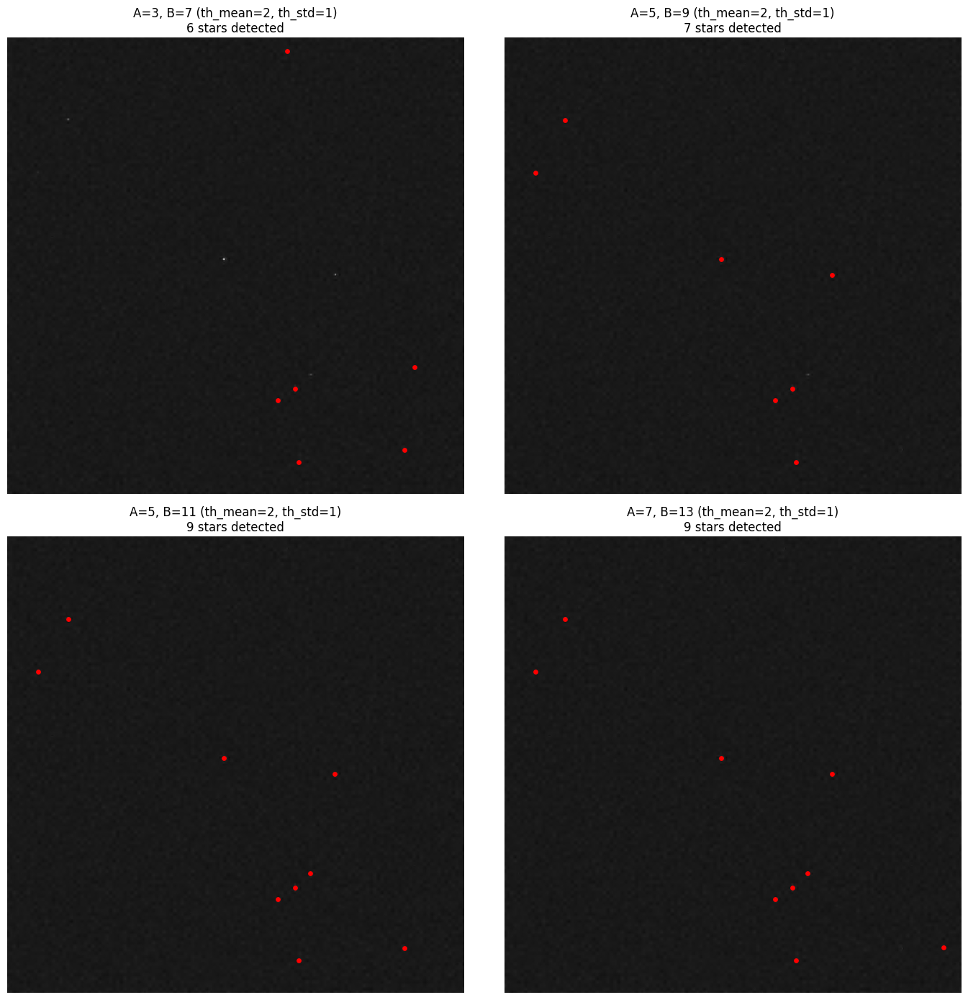

In [23]:
# Testing with different WINDOW SIZES (fixed thresholds)
test_img = denoised_images[0]

# Fixed threshold values
th_mean_fixed = 2
th_std_fixed = 1

# Define 4 different window size combinations
window_params = [
    {'A_size': 3, 'B_size': 7, 'label': 'A=3, B=7'},
    {'A_size': 5, 'B_size': 9, 'label': 'A=5, B=9'},
    {'A_size': 5, 'B_size': 11, 'label': 'A=5, B=11'},
    {'A_size': 7, 'B_size': 13, 'label': 'A=7, B=13'}
]

# Create 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, params in enumerate(window_params):
    A_size = params['A_size']
    B_size = params['B_size']
    label = params['label']
    
    # Detect stars with current window sizes
    stars = detect_stars_nested_base(test_img, A_size=A_size, B_size=B_size, 
                                      th_mean=th_mean_fixed, th_std=th_std_fixed)
    
    # Plot
    axes[idx].imshow(test_img, cmap='gray')
    for x, y in stars:
        axes[idx].scatter(x, y, c='red', s=15)
    axes[idx].set_title(f"{label} (th_mean={th_mean_fixed}, th_std={th_std_fixed})\n{len(stars)} stars detected")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

As it is visible, by choosing bigger windows we can identify bigger stars, ending up with a better detection rate when working on close constellation.
However, working with bigger windows is not always a good decision as it might "flatten" the research by not detecting smaller stars which end up hidden in the mean value of the inner window.
In order to avoid hiding stars in computations or ignoring bigger stars, the best decision is to scan the image with different sets of windows.

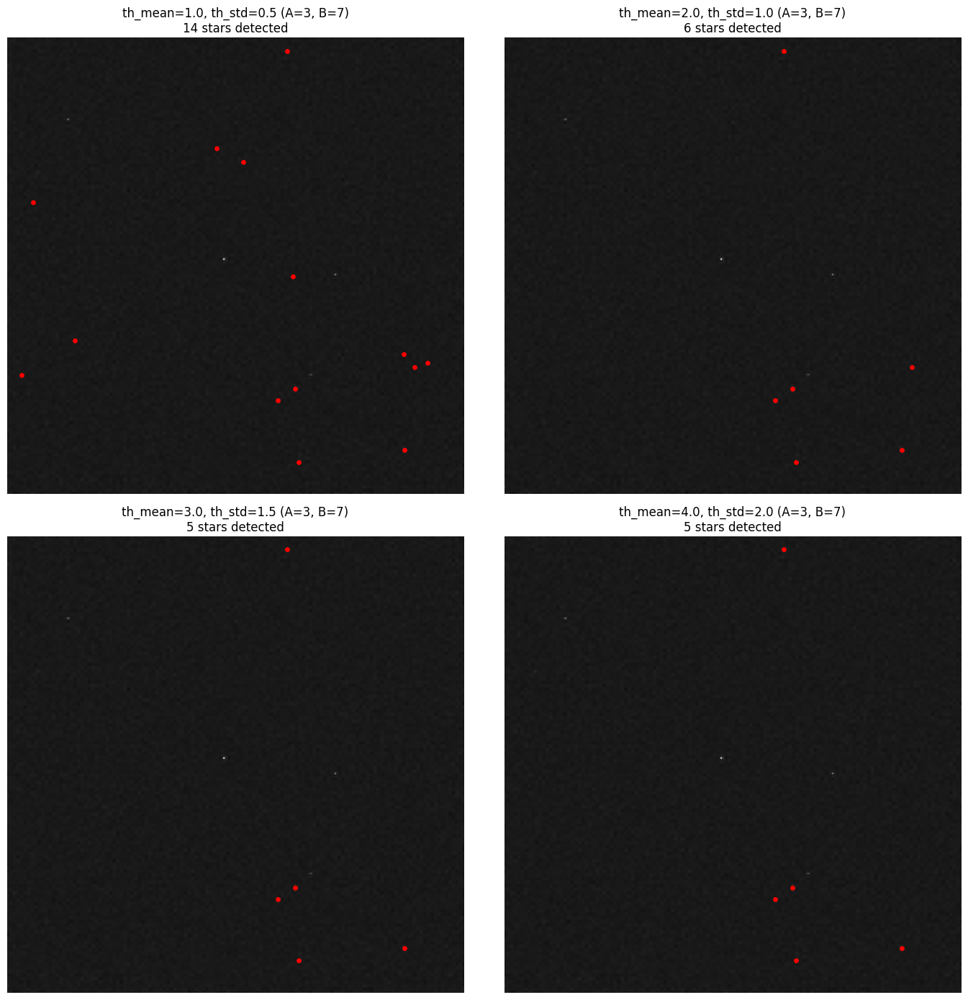

In [24]:
# Testing with different THRESHOLD VALUES (fixed window sizes)
test_img = denoised_images[0]

# Fixed window sizes
A_size_fixed = 3
B_size_fixed = 7

# Define 4 different threshold combinations
threshold_params = [
    {'th_mean': 1.0, 'th_std': 0.5, 'label': 'th_mean=1.0, th_std=0.5'},
    {'th_mean': 2.0, 'th_std': 1.0, 'label': 'th_mean=2.0, th_std=1.0'},
    {'th_mean': 3.0, 'th_std': 1.5, 'label': 'th_mean=3.0, th_std=1.5'},
    {'th_mean': 4.0, 'th_std': 2.0, 'label': 'th_mean=4.0, th_std=2.0'}
]

# Create 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, params in enumerate(threshold_params):
    th_mean = params['th_mean']
    th_std = params['th_std']
    label = params['label']
    
    # Detect stars with current thresholds
    stars = detect_stars_nested_base(test_img, A_size=A_size_fixed, B_size=B_size_fixed, 
                                      th_mean=th_mean, th_std=th_std)
    
    # Plot
    axes[idx].imshow(test_img, cmap='gray')
    for x, y in stars:
        axes[idx].scatter(x, y, c='red', s=15)
    axes[idx].set_title(f"{label} (A={A_size_fixed}, B={B_size_fixed})\n{len(stars)} stars detected")
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

By choosing smaller values of thresholds we can detect less bright stars. An idea is to use relative thresholds instead of absolute ones. But we will work on this point later on, after having first worked on the window size. 

In [25]:
def detect_stars_multiscale(img, 
                            A_sizes=[3,5,7], 
                            B_sizes=[7,11,15],
                            th_mean=4, th_std=3): 

    stars = []
    H, W = img.shape

    # Loop on alle scale combinations
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                A = img[y-rA:y+rA+1, x-rA:x+rA+1]
                B = img[y-rB:y+rB+1, x-rB:x+rB+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B (star = variation)
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    # if there are multiple stars within 3 pixels
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Compute pairwise distances
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster (the most central one)
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            # Keep the star at the center of the cluster
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep

Rilevati 20 picchi nell'immagine 3
Rilevati 15 picchi nell'immagine 4
Rilevati 20 picchi nell'immagine 5


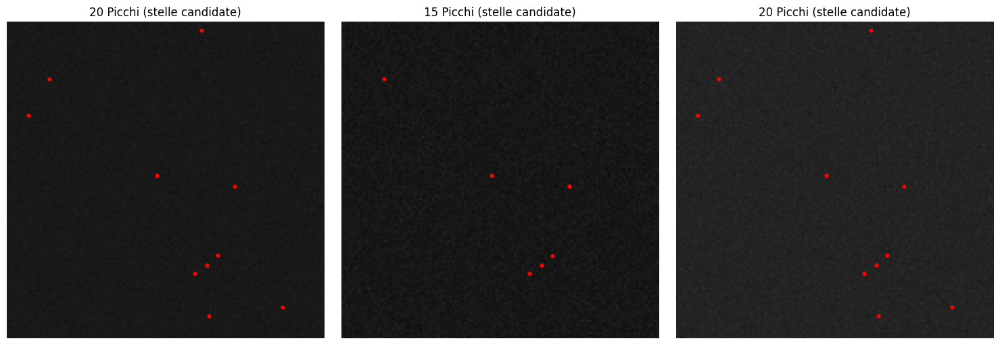

In [26]:
cols = 3
rows = 1

stars_multiscale = [None] * len(denoised_images)

fig = plt.figure(figsize=(15, 5))

for i, img in enumerate(denoised_images):
    
    stars_multiscale[i] = detect_stars_multiscale(img)
    print(f"Rilevati {len(stars_multiscale[i])} picchi nell'immagine {i + 3}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_multiscale[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_multiscale[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()


By using windows of different dimensions we are detecting more stars.
To not fall into the mistake of making the conditions for star detection more and more flexible to detect the maximum number of stars possible, possibly detecting also noise as one of those, it is better to first check the quality of our results and then to work on parameter tuning.

In [27]:
# Quantitative analysis: how many detected stars correspond to the ground truth

threshold_perf = np.percentile(greyscales[0], 80)
stars_perfect = peak_local_max(greyscales[0], min_distance=5, threshold_abs=threshold_perf)

stars_multiscale = [detect_stars_multiscale(img) for img in denoised_images]

def match_with_ground_truth(detected_stars, ground_truth, max_distance=5):

    if len(detected_stars) == 0 or len(ground_truth) == 0:
        return 0, 0, 0
    
    detected_array = np.array(detected_stars)
    # ground_truth already in form (y, x), convert to (x, y)
    gt_array = ground_truth[:, [1, 0]]
    
    # Calculate distances between detected stars and ground truth
    distances = cdist(detected_array, gt_array)
    
    # Count matches (detected star within max_distance of a true star)
    matches = 0
    matched_gt = set()
    
    for i in range(len(detected_array)):
        min_dist_idx = np.argmin(distances[i])
        if distances[i, min_dist_idx] <= max_distance:
            matches += 1
            matched_gt.add(min_dist_idx)
    
    true_positives = matches
    false_positives = len(detected_stars) - matches
    false_negatives = len(ground_truth) - len(matched_gt)
    
    return true_positives, false_positives, false_negatives

print("\n=== Match Analysis ===\n")
for i, stars in enumerate(stars_multiscale):
    tp, fp, fn = match_with_ground_truth(stars, stars_perfect, max_distance=5)
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print(f"Image {i+3}:")
    print(f"  True Positives:  {tp}")
    print(f"  False Positives: {fp}")
    print(f"  False Negatives: {fn}")
    print(f"  Precision: {precision:.2%}")
    print(f"  Recall:    {recall:.2%}")
    print(f"  F1-Score:  {f1:.2%}")
    print()


=== Match Analysis ===

Image 3:
  True Positives:  20
  False Positives: 0
  False Negatives: 302
  Precision: 100.00%
  Recall:    6.21%
  F1-Score:  11.70%

Image 4:
  True Positives:  15
  False Positives: 0
  False Negatives: 306
  Precision: 100.00%
  Recall:    4.67%
  F1-Score:  8.93%

Image 5:
  True Positives:  20
  False Positives: 0
  False Negatives: 302
  Precision: 100.00%
  Recall:    6.21%
  F1-Score:  11.70%



As we can see the results are quite good for precision, which is the parameter we want to maximize.
The only images that brings error is the fourth one, but for the moment we can accept this kind of error as we have not worked on parameters tuning already.

For the moment we can test the function with all the images to start having an idea of how to improve it

Rilevati 748 picchi nell'immagine 1
Rilevati 52 picchi nell'immagine 2
Rilevati 22 picchi nell'immagine 3
Rilevati 25 picchi nell'immagine 4
Rilevati 19 picchi nell'immagine 5
Rilevati 10 picchi nell'immagine 6
Rilevati 1 picchi nell'immagine 7


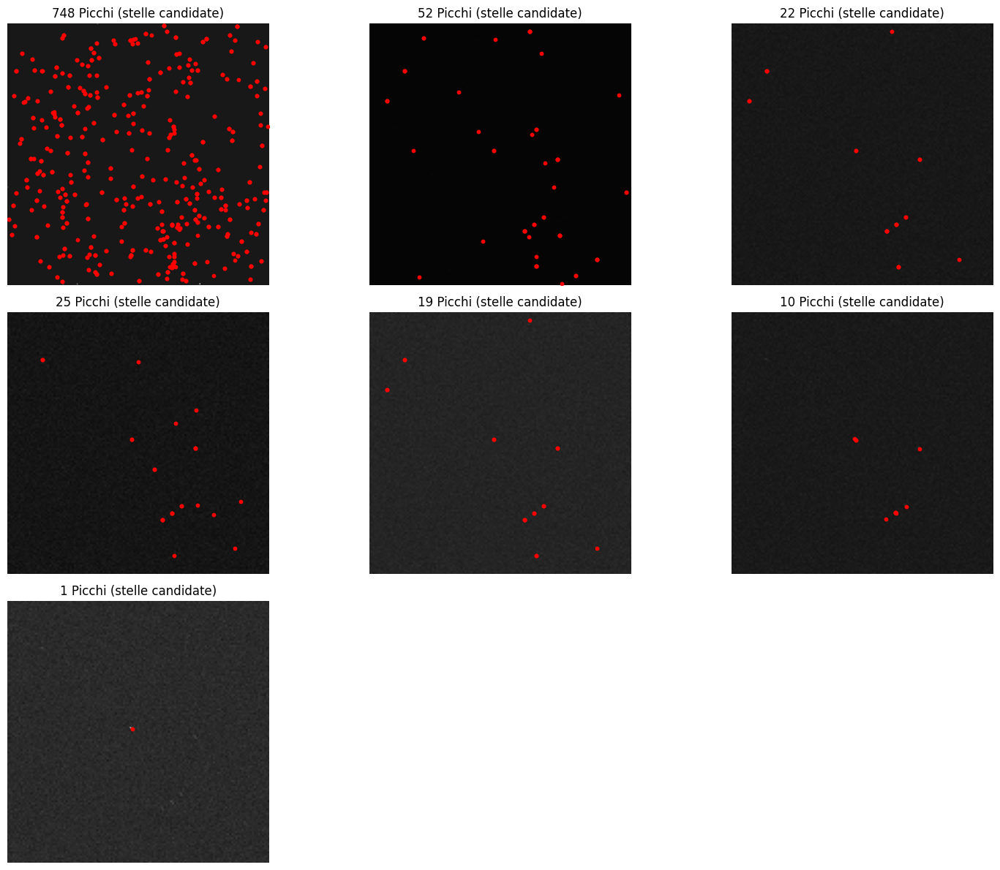

In [28]:
sigma_s_tot = []
mu_s_tot = []
delta_s_tot = []
safe_images_tot = []
aligned_images_tot = []
denoised_images_tot = []

safe_lower = 10
denoised_peak = 25.5

for i, img in enumerate(greyscales):

    #staying in safe range
    safe_images_tot.append(img[(img >= safe_lower)])

    #fitting gaussians
    mu, sigma = norm.fit(safe_images_tot[i])
    mu_s_tot.append(mu)
    sigma_s_tot.append(sigma)

    delta_s_tot.append(denoised_peak - mu)

    #aligning images
    aligned_images_tot.append(np.clip(img + delta_s_tot[i], 0, 255))

    #denoising images
    denoised_images_tot.append(wavelet_denoise(aligned_images_tot[i], sigma_s_tot[i]))

# Test on all denoised images
cols = 3
rows = 3

stars_multiscale = [None] * len(denoised_images_tot)
fig = plt.figure(figsize=(15, 12))

for i, img in enumerate(denoised_images_tot):
    
    stars_multiscale[i] = detect_stars_multiscale(img)
    print(f"Rilevati {len(stars_multiscale[i])} picchi nell'immagine {i + 1}")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    for x, y in stars_multiscale[i]:
        plt.scatter(x, y, c='red', s=10)
    plt.title(f"{len(stars_multiscale[i])} Picchi (stelle candidate)")
    plt.axis('off')

plt.tight_layout()
plt.show()

For the first two cases, with very small noise or zero noise, the peak computation is the "absolute" method. For this reason when writing the final function we will compute the noise before selecting the right procedure. 
Regarding the last two images instead, we can see that if in the sixth image one star is detected as multiple, in the last one, only one star is detected, even though we can see that there are more. To tune the parameters in order to solve this problem, it's better to first analize these two pictures.

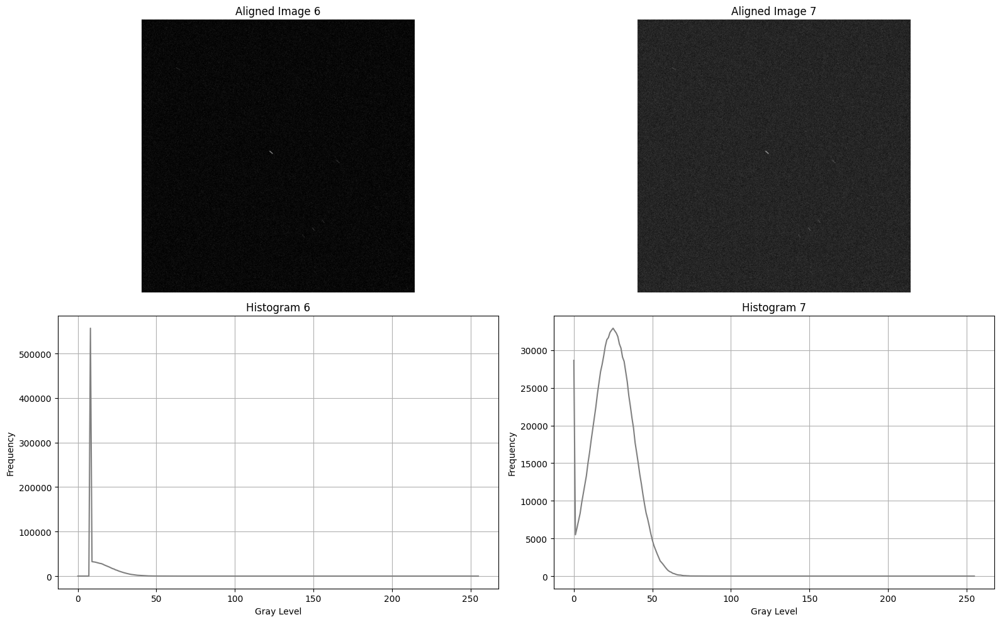

In [29]:
histograms = [
    np.histogram(aligned_images_tot[5].flatten(), bins=256, range=[0, 256])[0],
    np.histogram(aligned_images_tot[6].flatten(), bins=256, range=[0, 256])[0],
]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Images 
for i in range(2):
    axes[0, i].imshow(aligned_images_tot[i+5], cmap='gray')
    axes[0, i].set_title(f"Aligned Image {i+6}")
    axes[0, i].axis('off')

# Histograms
for i in range(2):
    axes[1, i].plot(histograms[i], color='gray')
    axes[1, i].set_title(f"Histogram {i+6}")
    axes[1, i].set_xlabel("Gray Level")
    axes[1, i].set_ylabel("Frequency")
    axes[1, i].grid(True)

plt.tight_layout()
plt.show()

We are working with some blurring noise that stretches the stars. For this kind of images, alignment and denoising is not enough. While the image can be improved in quality the stars remain stretched, not being identified as such by squared windows. We can solve the problem by working on eccentricity, windows dimensions and thresholds corrections.

## Adapting detection to stretched stars cases

In img6 and img7, stars are not circular but stretched, possibly because of optical aberration, motion during exposure or non-uniform defocus.

To enlarge windows based on the dimension of the possible star it is useful to use eccentricity. The main idea is to use it together with an additive factor to enlarge the window of only the necessary, without exaggerating and falling into "hiding" stars into too big windows.

Eccentricity is our choice because it works also for circular stars.

In [30]:
def detect_stars_multiscale_adaptive(img, 
                                     A_sizes=[3,5,7], 
                                     B_sizes=[7,11,15],
                                     th_mean=3, th_std=2,
                                     adapt_eccentricity=True,
                                     ecc_threshold=0.4,
                                     scale_eccentricity_factor=0.5):

    stars = []
    H, W = img.shape

    # Computing eccentricity map if adaptive is active
    eccentricity_map = None
    if adapt_eccentricity:
        eccentricity_map = np.zeros((H, W))
        # Use a radius of 5 pixels to calculate eccentricity
        for y in range(5, H - 5):
            for x in range(5, W - 5):
                # Extract 11x11 window centered
                window = img[y-5:y+6, x-5:x+6]
                # Calculate second order moments
                yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
                weights = window / (np.sum(window) + 1e-8)
                
                mxx = np.sum(weights * (xx - 5) ** 2)
                myy = np.sum(weights * (yy - 5) ** 2)
                mxy = np.sum(weights * (xx - 5) * (yy - 5))
                
                # Eigenvalues of the covariance matrix
                trace = mxx + myy
                det = mxx * myy - mxy ** 2
                if trace > 0:
                    lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    # Eccentricity: (λ1 - λ2) / (λ1 + λ2)
                    if lambda1 + lambda2 > 1e-8:
                        eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

    # Loop over all scales
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                # Adapt windows if the star is elongated
                rA_adapted = rA
                rB_adapted = rB
                
                if adapt_eccentricity and eccentricity_map is not None:
                    ecc = eccentricity_map[y, x]
                    if ecc > ecc_threshold:  # eccentricity threshold for elongation
                        # Increase search radius for elongated stars
                        scale_factor = 1 + scale_eccentricity_factor * ecc
                        rA_adapted = max(rA, int(rA * scale_factor))
                        rB_adapted = max(rB, int(rB * scale_factor))
                
                # Check bounds
                if y - rB_adapted < 0 or y + rB_adapted >= H or x - rB_adapted < 0 or x + rB_adapted >= W:
                    continue

                A = img[y-rA_adapted:y+rA_adapted+1, x-rA_adapted:x+rA_adapted+1]
                B = img[y-rB_adapted:y+rB_adapted+1, x-rB_adapted:x+rB_adapted+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Calculate distances between all stars
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep


Let's compare this new function with the standard one

COMPARISON: Standard vs Adaptive Detection (img6, img7)

Image 6 (stretched):
  Standard:  10 stars detected
  Adaptive:  21 stars detected
  → Improvement: +11 stars (110.0%)

Image 7 (noisy and stretched):
  Standard:  1 stars detected
  Adaptive:  2 stars detected
  → Improvement: +1 stars (100.0%)


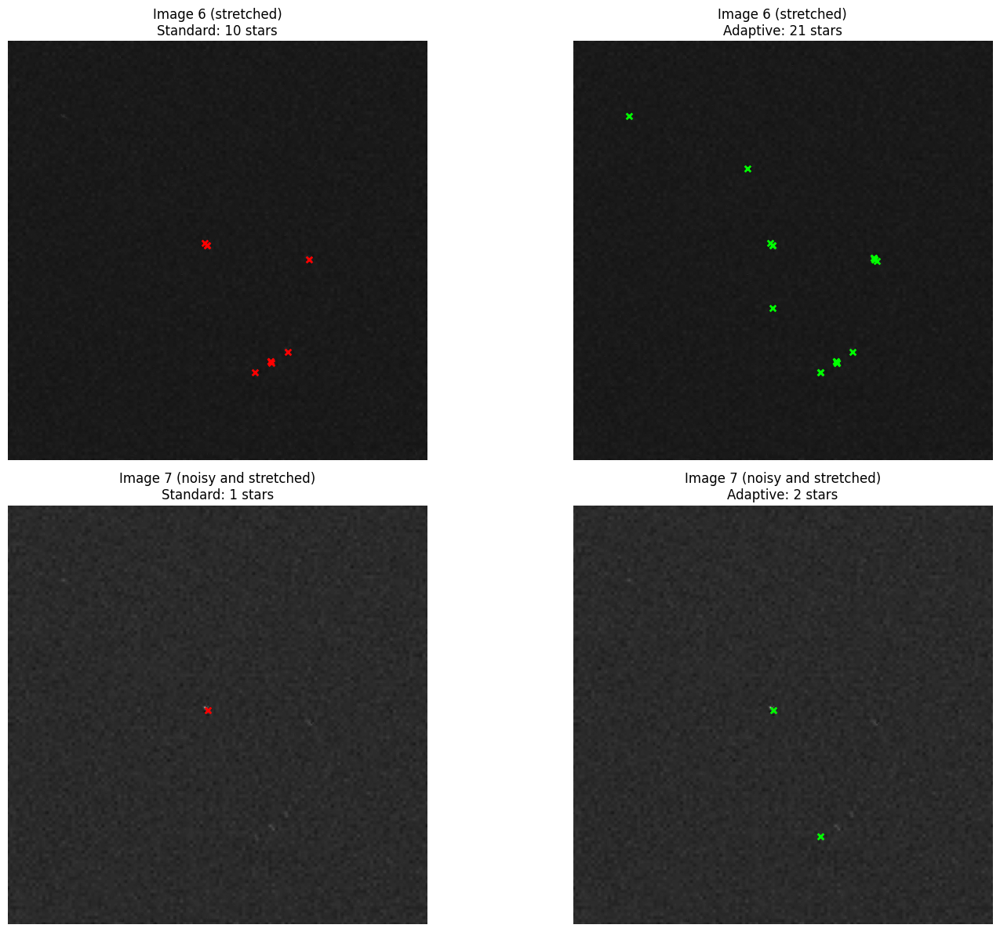

In [31]:
#Multiscale standard vs Adaptive on img6 e img7 (stretched stars)
print("=" * 60)
print("COMPARISON: Standard vs Adaptive Detection (img6, img7)")
print("=" * 60)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

test_images = [denoised_images_tot[5], denoised_images_tot[6]]
test_labels = ["Image 6 (stretched)", "Image 7 (noisy and stretched)"]

for idx, (img, label) in enumerate(zip(test_images, test_labels)):
    # standard detection
    stars_standard = detect_stars_multiscale(img)
    
    # adaptive detection
    stars_adaptive = detect_stars_multiscale_adaptive(img, adapt_eccentricity=True)
    
    # Visualize: Standard
    ax_standard = axes[idx, 0]
    ax_standard.imshow(img, cmap='gray')
    for x, y in stars_standard:
        ax_standard.scatter(x, y, c='red', s=30, marker='x', linewidths=2)
    ax_standard.set_title(f"{label}\nStandard: {len(stars_standard)} stars")
    ax_standard.axis('off')
    
    # Visualize: Adaptive
    ax_adaptive = axes[idx, 1]
    ax_adaptive.imshow(img, cmap='gray')
    for x, y in stars_adaptive:
        ax_adaptive.scatter(x, y, c='lime', s=30, marker='x', linewidths=2)
    ax_adaptive.set_title(f"{label}\nAdaptive: {len(stars_adaptive)} stars")
    ax_adaptive.axis('off')
    
    print(f"\n{label}:")
    print(f"  Standard:  {len(stars_standard)} stars detected")
    print(f"  Adaptive:  {len(stars_adaptive)} stars detected")
    if len(stars_adaptive) > len(stars_standard):
        diff = len(stars_adaptive) - len(stars_standard)
        print(f"  → Improvement: +{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")
    elif len(stars_adaptive) < len(stars_standard):
        diff = len(stars_standard) - len(stars_adaptive)
        print(f"  → Reduction: -{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")

plt.tight_layout()
plt.show()


COMPARISON: Standard vs Adaptive Detection (img6, img7)

Image 6 (stretched):
  Standard:  1 stars detected
  Adaptive:  21 stars detected
  → Improvement: +20 stars (2000.0%)

Image 7 (noisy and stretched):
  Standard:  1 stars detected
  Adaptive:  3 stars detected
  → Improvement: +2 stars (200.0%)


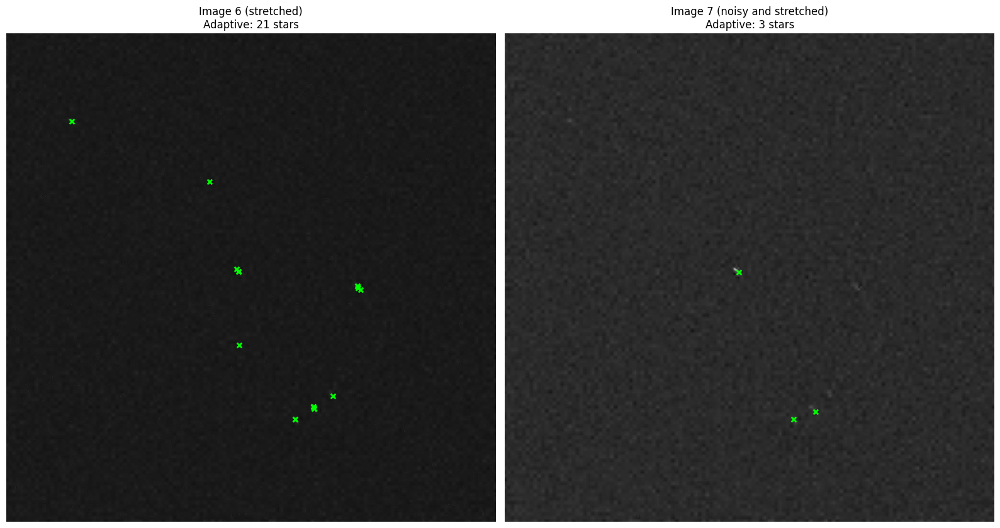

In [32]:
#Multiscale standard vs Adaptive on img6 e img7 (stretched stars)
print("=" * 60)
print("COMPARISON: Standard vs Adaptive Detection (img6, img7)")
print("=" * 60)

fig, axes = plt.subplots(1, 2, figsize=(16, 12))

test_images = [denoised_images_tot[5], denoised_images_tot[6]]
test_labels = ["Image 6 (stretched)", "Image 7 (noisy and stretched)"]

for idx, (img, label) in enumerate(zip(test_images, test_labels)):
    
    # adaptive detection
    stars_adaptive = detect_stars_multiscale_adaptive(img, adapt_eccentricity=True, th_std=1.3, ecc_threshold=0.16)
    
    # Visualize: Adaptive
    ax_adaptive = axes[idx]
    ax_adaptive.imshow(img, cmap='gray')
    for x, y in stars_adaptive:
        ax_adaptive.scatter(x, y, c='lime', s=30, marker='x', linewidths=2)
    ax_adaptive.set_title(f"{label}\nAdaptive: {len(stars_adaptive)} stars")
    ax_adaptive.axis('off')
    
    print(f"\n{label}:")
    print(f"  Standard:  {len(stars_standard)} stars detected")
    print(f"  Adaptive:  {len(stars_adaptive)} stars detected")
    if len(stars_adaptive) > len(stars_standard):
        diff = len(stars_adaptive) - len(stars_standard)
        print(f"  → Improvement: +{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")
    elif len(stars_adaptive) < len(stars_standard):
        diff = len(stars_standard) - len(stars_adaptive)
        print(f"  → Reduction: -{diff} stars ({100*diff/max(len(stars_standard),1):.1f}%)")

plt.tight_layout()
plt.show()

In order to understand how to better improve the detection for stretched images, recognizing also visible stars in the image6, it is useful to give a look to the eccentricity map and to check if the eccentricity threshold is well set.

Eccentricity diagnosis - img7

ECCENTRICITY STATISTICS:
  Min:     0.000
  Max:     0.290
  Media:   0.016
  Mediana: 0.013

COUNTING PIXELS FOR THRESHOLD:
  ecc > 0.3:     0 pixel ( 0.00%)
  ecc > 0.4:     0 pixel ( 0.00%)
  ecc > 0.5:     0 pixel ( 0.00%)
  ecc > 0.6:     0 pixel ( 0.00%)
  ecc > 0.7:     0 pixel ( 0.00%)


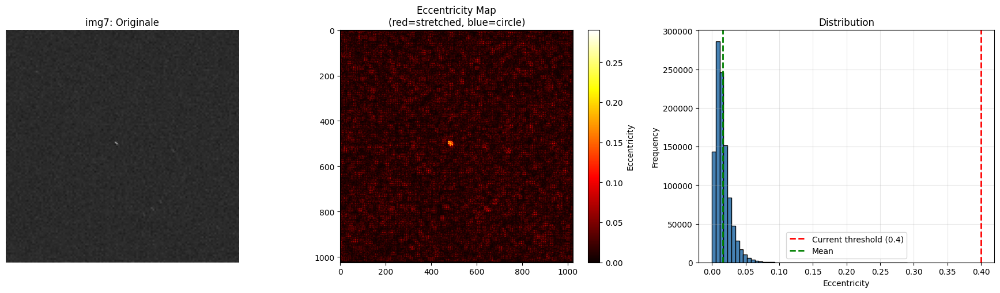

In [33]:
# Analizing eccentricity in img7

debug_img = denoised_images_tot[6] 
print("=" * 70)
print("Eccentricity diagnosis - img7")
print("=" * 70)

H, W = debug_img.shape
eccentricity_map = np.zeros((H, W))

# computing eccentricity (same function logic)
for y in range(5, H - 5):
    for x in range(5, W - 5):
        window = debug_img[y-5:y+6, x-5:x+6]
        yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
        weights = window / (np.sum(window) + 1e-8)
        
        mxx = np.sum(weights * (xx - 5) ** 2)
        myy = np.sum(weights * (yy - 5) ** 2)
        mxy = np.sum(weights * (xx - 5) * (yy - 5))
        
        trace = mxx + myy
        det = mxx * myy - mxy ** 2
        if trace > 0:
            lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
            lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
            if lambda1 + lambda2 > 1e-8:
                eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

# Statistiche
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
print(f"\nECCENTRICITY STATISTICS:")
print(f"  Min:     {np.min(ecc_nonzero):.3f}")
print(f"  Max:     {np.max(ecc_nonzero):.3f}")
print(f"  Media:   {np.mean(ecc_nonzero):.3f}")
print(f"  Mediana: {np.median(ecc_nonzero):.3f}")

print(f"\nCOUNTING PIXELS FOR THRESHOLD:")
for th in [0.3, 0.4, 0.5, 0.6, 0.7]:
    count = np.sum(eccentricity_map > th)
    pct = 100 * count / (H * W)
    print(f"  ecc > {th:.1f}: {count:5d} pixel ({pct:5.2f}%)")

# heatmap
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Original
axes[0].imshow(debug_img, cmap='gray')
axes[0].set_title('img7: Originale')
axes[0].axis('off')

# Heatmap eccentricity
im = axes[1].imshow(eccentricity_map, cmap='hot')
axes[1].set_title('Eccentricity Map\n(red=stretched, blue=circle)')
plt.colorbar(im, ax=axes[1], label='Eccentricity')

# Istogramma
axes[2].hist(ecc_nonzero, bins=50, color='steelblue', edgecolor='black')
axes[2].axvline(0.4, color='red', linestyle='--', linewidth=2, label='Current threshold (0.4)')
axes[2].axvline(np.mean(ecc_nonzero), color='green', linestyle='--', linewidth=2, label='Mean')
axes[2].set_xlabel('Eccentricity')
axes[2].set_ylabel('Frequency')
axes[2].set_title('Distribution')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


The eccentricity is very low with respect to our threshold, for this reason our stars are "not stretched enough" to be detected. The idea is to set the eccentricity threshold to a lower value


=== ECCENTRICITY STATISTICS (IMG7) ===
Mean:         0.016060
Median:       0.013361
Mode (peak):  0.010156
Std Dev:       0.011672
Min:           0.000000
Max:           0.290162

Ratio Mean/Mode: 1.58x


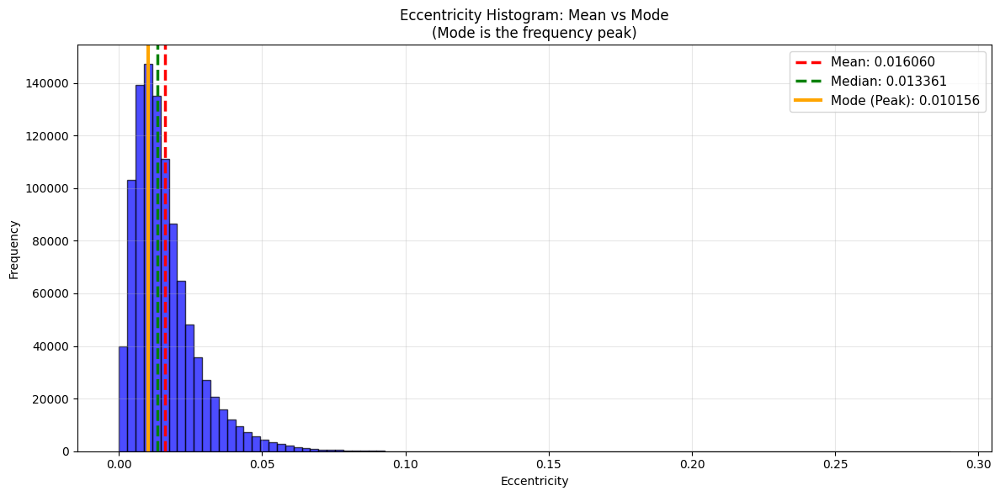

In [34]:
#Computing mode, mean and median of eccentricity distribution
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
ecc_mean = np.mean(ecc_nonzero)
ecc_median = np.median(ecc_nonzero)
ecc_std = np.std(ecc_nonzero)

# computing the histogram peak 
hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
peak_bin_idx = np.argmax(hist_counts)
peak_frequency = hist_bins[peak_bin_idx]  # centro del bin col massimo
peak_frequency_right = hist_bins[peak_bin_idx + 1]  # bordo destro
ecc_mode = (peak_frequency + peak_frequency_right) / 2

print(f"\n=== ECCENTRICITY STATISTICS (IMG7) ===")
print(f"Mean:         {ecc_mean:.6f}")
print(f"Median:       {ecc_median:.6f}")
print(f"Mode (peak):  {ecc_mode:.6f}")
print(f"Std Dev:       {ecc_std:.6f}")
print(f"Min:           {np.min(ecc_nonzero):.6f}")
print(f"Max:           {np.max(ecc_nonzero):.6f}")
print(f"\nRatio Mean/Mode: {ecc_mean/ecc_mode:.2f}x")

# Visualizza media e moda sull'istogramma
fig, ax = plt.subplots(figsize=(12, 6))
ax.hist(ecc_nonzero, bins=100, alpha=0.7, color='blue', edgecolor='black')
ax.axvline(ecc_mean, color='red', linestyle='--', linewidth=2.5, label=f'Mean: {ecc_mean:.6f}')
ax.axvline(ecc_median, color='green', linestyle='--', linewidth=2.5, label=f'Median: {ecc_median:.6f}')
ax.axvline(ecc_mode, color='orange', linestyle='-', linewidth=3, label=f'Mode (Peak): {ecc_mode:.6f}')
ax.set_xlabel('Eccentricity')
ax.set_ylabel('Frequency')
ax.set_title('Eccentricity Histogram: Mean vs Mode\n(Mode is the frequency peak)')
ax.legend(fontsize=11)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()



The peak, or mode, represents the most frequent value. By using the mean we can capture more stretched stars, while using the mode we focus on the main population.
Because we want to work on precision, we will use the mode.

Before immediately changing the eccentricity parameter into an input parameter, let's also analyze the intensity of the stars in the image in order to set also relative values of std and mean thresholds. We do this because some stars that were not detected in img7 were not too stretched or too small to be detected but most probably they were "too grey" to pop up from the scan analisis that was done on the image

=== TOP 10 BRIGHTER PIXELS ===
#   Center   ΔMean    ΔVar     Pass th_mean=4  Pass th_std=3   PASS 
1   115.0    16.03    57.48    ✓               ✓               ✓    
2   102.0    19.08    123.62   ✓               ✓               ✓    
3   101.0    20.30    -9.96    ✓               ✗               ✗    
4   99.0     18.73    2.43     ✓               ✗               ✗    
5   97.0     16.81    4.26     ✓               ✓               ✓    
6   94.0     19.68    -3.84    ✓               ✗               ✗    
7   94.0     17.58    14.22    ✓               ✓               ✓    
8   91.0     15.42    100.60   ✓               ✓               ✓    
9   88.0     16.91    58.35    ✓               ✓               ✓    
10  88.0     20.35    16.10    ✓               ✓               ✓    

=== STATISTICS ===
Total candidates (top 0.5% intensity): 2937
Pass th_mean > 4:  175/2937 (6.0%)
Pass th_std > 3:   142/2937 (4.8%)
Pass BOTH:         97/2937 (3.3%)


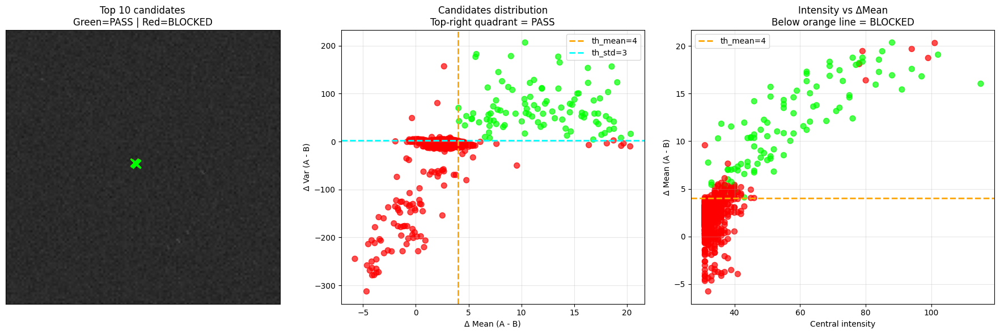

In [ ]:
# Checking if the weak stars are filtered out by absolute thresholds
# Find the brightest pixels (potential stars)
threshold_bright = np.percentile(denoised_images_tot[6], 99.5)  # top 0.5%
bright_pixels = np.where(denoised_images_tot[6] > threshold_bright)

# Analyze the intensity around each bright pixel
intensities = []
for y, x in zip(bright_pixels[0], bright_pixels[1]):
    if y > 7 and y < denoised_images_tot[6].shape[0]-7 and x > 7 and x < denoised_images_tot[6].shape[1]-7:
        # Window A (inner) and B (outer)
        A = denoised_images_tot[6][y-3:y+4, x-3:x+4]
        B = denoised_images_tot[6][y-7:y+8, x-7:x+8]
        
        mean_A = np.mean(A)
        mean_B = np.mean(B)
        var_A = np.var(A)
        var_B = np.var(B)
        
        # Current conditions
        diff_mean = mean_A - mean_B
        diff_var = var_A - var_B
        
        intensities.append({
            'x': x, 'y': y,
            'center': denoised_images_tot[6][y, x],
            'mean_A': mean_A,
            'mean_B': mean_B,
            'diff_mean': diff_mean,
            'var_A': var_A,
            'var_B': var_B,
            'diff_var': diff_var,
            'passes_th_mean_4': diff_mean > 4,
            'passes_th_std_3': diff_var > 3,
            'passes_both': (diff_mean > 4) and (diff_var > 3)
        })

# Sort by central intensity
intensities.sort(key=lambda x: x['center'], reverse=True)

print(f"=== TOP 10 BRIGHTER PIXELS ===")
print(f"{'#':<3} {'Center':<8} {'ΔMean':<8} {'ΔVar':<8} {'Pass th_mean=4':<15} {'Pass th_std=3':<15} {'PASS':<5}")
print("="*80)
for i, data in enumerate(intensities[:10]):
    print(f"{i+1:<3} {data['center']:<8.1f} {data['diff_mean']:<8.2f} {data['diff_var']:<8.2f} "
          f"{'✓' if data['passes_th_mean_4'] else '✗':<15} "
          f"{'✓' if data['passes_th_std_3'] else '✗':<15} "
          f"{'✓' if data['passes_both'] else '✗':<5}")

# Count how many pass
total = len(intensities)
pass_mean = sum(1 for d in intensities if d['passes_th_mean_4'])
pass_var = sum(1 for d in intensities if d['passes_th_std_3'])
pass_both = sum(1 for d in intensities if d['passes_both'])

print(f"\n=== STATISTICS ===")
print(f"Total candidates (top 0.5% intensity): {total}")
print(f"Pass th_mean > 4:  {pass_mean}/{total} ({100*pass_mean/total:.1f}%)")
print(f"Pass th_std > 3:   {pass_var}/{total} ({100*pass_var/total:.1f}%)")
print(f"Pass BOTH:         {pass_both}/{total} ({100*pass_both/total:.1f}%)")
# Visualize on the map
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

ax = axes[0]
ax.imshow(denoised_images_tot[6], cmap='gray')
for data in intensities[:10]:
    color = 'lime' if data['passes_both'] else 'red'
    ax.plot(data['x'], data['y'], 'x', color=color, markersize=10, markeredgewidth=2)
ax.set_title(f'Top 10 candidates\nGreen=PASS | Red=BLOCKED')
ax.set_xticks([])
ax.set_yticks([])

ax = axes[1]
diff_means = [d['diff_mean'] for d in intensities]
diff_vars = [d['diff_var'] for d in intensities]
colors_scatter = ['lime' if d['passes_both'] else 'red' for d in intensities]
ax.scatter(diff_means, diff_vars, c=colors_scatter, alpha=0.7, s=50)
ax.axvline(4, color='orange', linestyle='--', linewidth=2, label='th_mean=4')
ax.axhline(3, color='cyan', linestyle='--', linewidth=2, label='th_std=3')
ax.set_xlabel('Δ Mean (A - B)')
ax.set_ylabel('Δ Var (A - B)')
ax.set_title('Candidates distribution\nTop-right quadrant = PASS')
ax.legend()
ax.grid(alpha=0.3)

ax = axes[2]
centers = [d['center'] for d in intensities]
ax.scatter(centers, diff_means, c=colors_scatter, alpha=0.7, s=50)
ax.axhline(4, color='orange', linestyle='--', linewidth=2, label='th_mean=4')
ax.set_xlabel('Central intensity')
ax.set_ylabel('Δ Mean (A - B)')
ax.set_title('Intensity vs ΔMean\nBelow orange line = BLOCKED')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Weak stars have smalller ΔMean and ΔVar, for this reason absolute threshold that were setted in the previous functions (th_mean=4, th_std=3) exclude them. One way to solve this problem is to use relative threshold computed directly on the image characteristics.

=== SCENARIO 1: No eccentricity or parameter adaptation ===
Stelle rilevate (senza adattamento): 2

=== SCENARIO 2: Usa MODA (picco frequenza) ===
  Moda eccentricità: 0.010156
  Stelle rilevate (con moda): 4


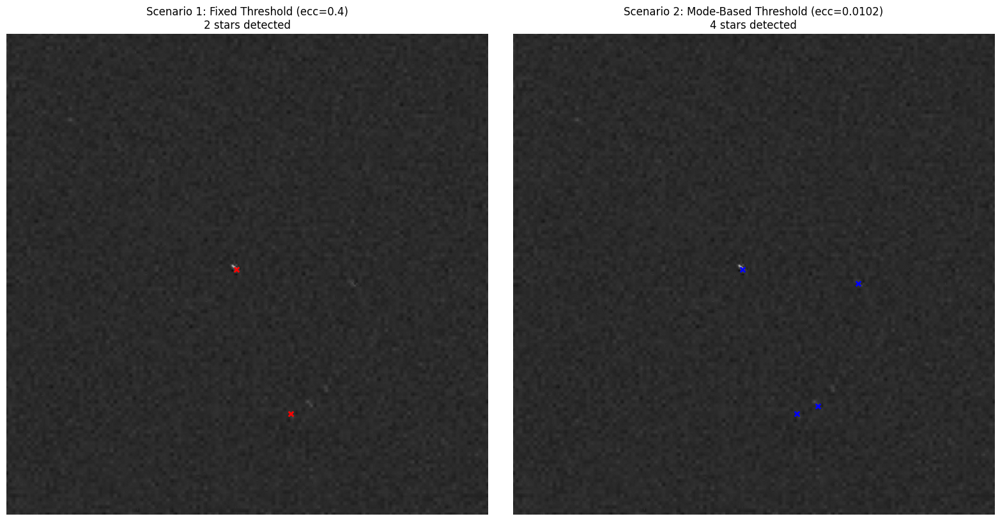


COMPARISON - Image 7 (Denoised)
Scenario 1 (Fixed ecc=0.4):     2 stars
Scenario 2 (Mode ecc=0.0102): 4 stars
Difference: 2 stars


In [ ]:
# Using the adaptive function in different scenarios

print("=== SCENARIO 1: No eccentricity or parameter adaptation ===")
stars_classic = detect_stars_multiscale_adaptive(denoised_images_tot[6],  # immagine 7 denoised
                                                     adapt_eccentricity=False)
print(f"Detected Stars (without adaptation): {len(stars_classic)}")

print("\n=== SCENARIO 2: Use MODE (frequency peak) ===")
ecc_nonzero = eccentricity_map[eccentricity_map > 0]
hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
peak_bin_idx = np.argmax(hist_counts)
ecc_mode = (hist_bins[peak_bin_idx] + hist_bins[peak_bin_idx + 1]) / 2
print(f"  Mode eccentricity: {ecc_mode:.6f}")

stars_mode = detect_stars_multiscale_adaptive(denoised_images_tot[6],  # immagine 7 denoised
                                                  adapt_eccentricity=True,
                                                  ecc_threshold=ecc_mode, th_std=ecc_mode/2)
print(f"  Stars detected (with mode): {len(stars_mode)}")

# Visualize the results of the two scenarios for comparison
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# SCENARIO 1: Standard (with fixed threshold)
stars_standard = detect_stars_multiscale_adaptive(denoised_images_tot[6],  # image 7
                                                   adapt_eccentricity=True,
                                                   ecc_threshold=0.4)

axes[0].imshow(denoised_images_tot[6], cmap='gray')
for x, y in stars_standard:
    axes[0].scatter(x, y, c='red', s=30, marker='x', linewidths=2)
axes[0].set_title(f"Scenario 1: Fixed Threshold (ecc=0.4)\n{len(stars_standard)} stars detected")
axes[0].axis('off')

# SCENARIO 2: Use MODE
axes[1].imshow(denoised_images_tot[6], cmap='gray')
for x, y in stars_mode:
    axes[1].scatter(x, y, c='blue', s=30, marker='x', linewidths=2)
axes[1].set_title(f"Scenario 2: Mode-Based Threshold (ecc={ecc_mode:.4f})\n{len(stars_mode)} stars detected")
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Print statistical comparison
print(f"\n{'='*60}")
print(f"COMPARISON - Image 7 (Denoised)")
print(f"{'='*60}")
print(f"Scenario 1 (Fixed ecc=0.4):     {len(stars_standard)} stars")
print(f"Scenario 2 (Mode ecc={ecc_mode:.4f}): {len(stars_mode)} stars")
print(f"Difference: {abs(len(stars_standard) - len(stars_mode))} stars")



We can now check if our answers are correct and move on writing the final detection function

In [ ]:
stars_adaptive_new = [detect_stars_multiscale_adaptive(denoised_images_tot[5], adapt_eccentricity=True, ecc_threshold=0.16),
                      detect_stars_multiscale_adaptive(denoised_images_tot[6], adapt_eccentricity=True, ecc_threshold=0.16)]

print("\n=== Match Analysis ===\n")
for i, stars in enumerate(stars_adaptive_new):
    tp, fp, fn = match_with_ground_truth(stars, stars_perfect, max_distance=5)
    
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    
    print(f"Image {i+5}:")
    print(f"  True Positives:  {tp}")
    print(f"  False Positives: {fp}")
    print(f"  False Negatives: {fn}")
    print(f"  Precision: {precision:.2%}")
    print(f"  Recall:    {recall:.2%}")
    print(f"  F1-Score:  {f1:.2%}")
    print()


=== Match Analysis ===

Image 5:
  True Positives:  17
  False Positives: 4
  False Negatives: 305
  Precision: 80.95%
  Recall:    5.28%
  F1-Score:  9.91%

Image 6:
  True Positives:  1
  False Positives: 1
  False Negatives: 311
  Precision: 50.00%
  Recall:    0.32%
  F1-Score:  0.64%



The low recall values observed in Images 5 and 6 are mainly due to the fact that false negatives are computed with respect to the original, noise-free reference image, while the test images are heavily degraded by noise. As a result, several stars included in the ground truth are no longer distinguishable in the noisy images and cannot be reasonably detected.

Conversely, the relatively high precision indicates that the proposed detection method is conservative and reliable, favoring accurate detections over exhaustive star recovery. This design choice is consistent with the overall pipeline, where the detection stage aims to provide a set of reliable star candidates, while false positives are further filtered during the centroid localization phase.

## Writing the final functions

The following functions are the result of all that was previously said about image processing for detection

In [35]:
def align_image(img):
    img_safe = img[img >= 10] #safe_lower
    mu, sigma = norm.fit(img_safe)
    delta = 25.5 - mu  #denoised_peak
    aligned_img = np.clip(img + delta, 0, 255)
    return sigma,aligned_img

In [36]:
def denoise_image(img, wave='db2', level=3, k=3):

    sigma, aligned_img = align_image(img)

    # Wavelet decomposition
    coeffs = pywt.wavedec2(aligned_img, wave, level=level)

    # Threshold based on noise
    T = k * sigma

    # Process detail coefficients (skip approximation coeffs[0])
    coeffs_thresh = [coeffs[0]]  # keep the approximation untouched

    for detail_level in coeffs[1:]:
        cH, cV, cD = detail_level
        cH = pywt.threshold(cH, T, mode='soft')
        cV = pywt.threshold(cV, T, mode='soft')
        cD = pywt.threshold(cD, T, mode='soft')
        coeffs_thresh.append((cH, cV, cD))

    # Reconstruct denoised image
    denoised = pywt.waverec2(coeffs_thresh, wave)
    return np.clip(denoised, 0, 255).astype(np.uint8)

In [37]:
def isnoisy_image(img):

    #computing cumulative histogram
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0, 256])

    # Cumulative Histogram
    cum_hist = hist.cumsum()
    cum_hist_norm = cum_hist / cum_hist[-1]   # normalized (0–1)

    # Find the gray level where 80% of pixels are included
    threshold_index = np.where(cum_hist_norm >= 0.8)[0][0]
    gray_level_80 = bins[threshold_index]

    #print(gray_level_80)

    return gray_level_80 > 30 #background

In [ ]:
def estimate_noise(img_gray):
    patch = img_gray[100:200, 100:200]  #portion of image
    noise_std = np.std(patch)
    return noise_std

In [39]:
def detect_stars_multiscale_adaptive(img, 
                                     A_sizes=[3,5,7], 
                                     B_sizes=[7,11,15],
                                     th_mean=3, th_std=2,
                                     adapt_eccentricity=True,
                                     ecc_threshold=0.4,
                                     scale_eccentricity_factor=0.5):

    stars = []
    H, W = img.shape

    # Computing eccentricity map if adaptive is active
    eccentricity_map = None
    if adapt_eccentricity:
        eccentricity_map = np.zeros((H, W))
        # Use a radius of 5 pixels to calculate eccentricity
        for y in range(5, H - 5):
            for x in range(5, W - 5):
                # Extract 11x11 window centered
                window = img[y-5:y+6, x-5:x+6]
                # Calculate second order moments
                yy, xx = np.meshgrid(np.arange(11), np.arange(11), indexing='ij')
                weights = window / (np.sum(window) + 1e-8)
                
                mxx = np.sum(weights * (xx - 5) ** 2)
                myy = np.sum(weights * (yy - 5) ** 2)
                mxy = np.sum(weights * (xx - 5) * (yy - 5))
                
                # Eigenvalues of the covariance matrix
                trace = mxx + myy
                det = mxx * myy - mxy ** 2
                if trace > 0:
                    lambda1 = (trace + np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    lambda2 = (trace - np.sqrt(max(trace**2 - 4*det, 0))) / 2
                    # Eccentricity: (λ1 - λ2) / (λ1 + λ2)
                    if lambda1 + lambda2 > 1e-8:
                        eccentricity_map[y, x] = (lambda1 - lambda2) / (lambda1 + lambda2)

    # Loop over all scales
    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                # Adapt windows if the star is elongated
                rA_adapted = rA
                rB_adapted = rB
                
                if adapt_eccentricity and eccentricity_map is not None:
                    ecc = eccentricity_map[y, x]
                    if ecc > ecc_threshold:  # eccentricity threshold for elongation
                        # Increase search radius for elongated stars
                        scale_factor = 1 + scale_eccentricity_factor * ecc
                        rA_adapted = max(rA, int(rA * scale_factor))
                        rB_adapted = max(rB, int(rB * scale_factor))
                
                # Check bounds
                if y - rB_adapted < 0 or y + rB_adapted >= H or x - rB_adapted < 0 or x + rB_adapted >= W:
                    continue

                A = img[y-rA_adapted:y+rA_adapted+1, x-rA_adapted:x+rA_adapted+1]
                B = img[y-rB_adapted:y+rB_adapted+1, x-rB_adapted:x+rB_adapted+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Calculate distances between all stars
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep


In [ ]:
def estimate_blur(img_gray):
    lap = cv2.Laplacian(img_gray, cv2.CV_64F)
    var_lap = lap.var()
    return var_lap

In [41]:
def detect_stars_multiscale(img, 
                            A_sizes=[3,5,7], 
                            B_sizes=[7,11,15],
                            th_mean=4, th_std=3): 

    stars = []
    H, W = img.shape

    for A_size, B_size in zip(A_sizes, B_sizes):
        rA = A_size // 2
        rB = B_size // 2

        for y in range(rB, H - rB):
            for x in range(rB, W - rB):

                A = img[y-rA:y+rA+1, x-rA:x+rA+1]
                B = img[y-rB:y+rB+1, x-rB:x+rB+1]

                center = img[y, x]

                # Condition 1: the center must be a local maximum in A
                if center != np.max(A):
                    continue

                # Condition 2: the mean of A must be significantly higher than B
                mean_A = np.mean(A)
                mean_B = np.mean(B)
                if mean_A <= mean_B + th_mean:
                    continue

                # Condition 3: the variance of A must be higher than B (star = variation)
                var_A = np.var(A)
                var_B = np.var(B)
                if var_A <= var_B + th_std:
                    continue

                stars.append((x, y))

    # Remove duplicates keeping only the star closest to the center
    # if there are multiple stars within 3 pixels
    if len(stars) == 0:
        return []
    
    stars_array = np.array(stars)
    from scipy.spatial.distance import cdist
    
    # Compute pairwise distances
    distances = cdist(stars_array, stars_array)
    
    # Find clusters of nearby stars (within 3 pixels)
    keep = []
    used = set()
    
    for i in range(len(stars)):
        if i in used:
            continue
        
        # Find all nearby stars
        close_stars = np.where((distances[i] < 3) & (distances[i] > 0))[0]
        
        if len(close_stars) == 0:
            keep.append(stars[i])
            used.add(i)
        else:
            # Keep only one star per cluster (the most central one)
            cluster_indices = [i] + list(close_stars)
            cluster_stars = [stars[idx] for idx in cluster_indices]
            
            # Keep the star at the center of the cluster
            cluster_center = np.mean(cluster_stars, axis=0)
            distances_to_center = [np.linalg.norm(np.array(s) - cluster_center) for s in cluster_stars]
            best_idx = cluster_indices[np.argmin(distances_to_center)]
            
            keep.append(stars[best_idx])
            used.update(cluster_indices)
    
    return keep

In [ ]:
def detect_stars(img):
    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    noise_thresh = 12.90
    blur_thresh = 200
    blur_motion_thresh = 3

    if estimate_noise(gray_img) > noise_thresh:
        denoised_img = denoise_image(gray_img)
        
        if estimate_blur(denoised_img) < blur_motion_thresh:
            print("Image is also blurred: adapting eccentricity threshold.")
            ecc_nonzero = eccentricity_map[eccentricity_map > 0]
            hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
            peak_bin_idx = np.argmax(hist_counts)
            ecc_mode = (hist_bins[peak_bin_idx] + hist_bins[peak_bin_idx + 1]) / 2
            stars = detect_stars_multiscale_adaptive(denoised_img, adapt_eccentricity=True, ecc_threshold=ecc_mode, 
                                            th_std=ecc_mode/2)

        else:
            print("Image is only noisy.")
            stars = detect_stars_multiscale(denoised_img)
    else:
        
        if estimate_blur(gray_img) < blur_thresh:
            print("Image is clean: using local max")
            stars = peak_local_max(gray_img, min_distance=8, threshold_abs=np.percentile(gray_img, 80))
            stars = np.array([(c[1], c[0]) for c in stars])  # (x, y) format

        else:
            print("Image is blurred: adapting eccentricity threshold.")
            denoised_img = denoise_image(gray_img)
            ecc_nonzero = eccentricity_map[eccentricity_map > 0]
            hist_counts, hist_bins = np.histogram(ecc_nonzero, bins=100)
            peak_bin_idx = np.argmax(hist_counts)
            ecc_mode = (hist_bins[peak_bin_idx] + hist_bins[peak_bin_idx + 1]) / 2
            stars = detect_stars_multiscale_adaptive(denoised_img, adapt_eccentricity=True, ecc_threshold=ecc_mode, 
                                            th_std=ecc_mode/2)
    
    return stars

The final detection is now built following all that was previously said, but briefly explaining it:
* if the image is noisy we denoise the image and we check for motion blur, we can than calibrate the multiscale function based on the kind of noise we are working with
* if the image is not noisy we can simply set a threshold and detect as star every object above that threshold


# Lost detection function

The program that we want to improve use an iterative weighted center of gravity algorithm to detect stars, and more precisely their centroids.

IWCoG Algorithm from LOST

In [43]:
def basic_threshold(image):

    total_pixels = image.size
    mean = np.mean(image)
    std = np.std(image)
    return mean + (std * 5)

In [44]:
def iwcog_helper(image, start_idx, cutoff, checked_indices, image_width, image_height):

    star_indices = []
    x_min = start_idx % image_width
    x_max = start_idx % image_width
    y_min = start_idx // image_width
    y_max = start_idx // image_width
    max_intensity = 0
    guess = start_idx
    is_valid = True
    
    # Stack per evitare ricorsione profonda (problema in Python)
    stack = [start_idx]
    
    while stack:
        i = stack.pop()
        
        # Controlla bounds e se già visitato
        if i < 0 or i >= image_width * image_height:
            continue
        if i in checked_indices:
            continue
        if image.flat[i] < cutoff:
            continue
            
        # Marca come visitato
        checked_indices.add(i)
        star_indices.append(i)
        
        # Controlla se tocca i bordi (stella non valida)
        x = i % image_width
        y = i // image_width
        if x == 0 or x == image_width - 1 or y == 0 or y == image_height - 1:
            is_valid = False
        
        # Aggiorna bounding box
        if x > x_max:
            x_max = x
        elif x < x_min:
            x_min = x
        if y > y_max:
            y_max = y
        elif y < y_min:
            y_min = y
        
        # Aggiorna intensità massima
        if image.flat[i] > max_intensity:
            max_intensity = image.flat[i]
            guess = i
        
        # Aggiungi vicini allo stack (4-connectivity)
        if x < image_width - 1:
            stack.append(i + 1)  # right
        if x > 0:
            stack.append(i - 1)  # left
        if y < image_height - 1:
            stack.append(i + image_width)  # down
        if y > 0:
            stack.append(i - image_width)  # up
    
    return star_indices, x_min, x_max, y_min, y_max, max_intensity, guess, is_valid

In [45]:
def iterative_weighted_cog(image, min_change=0.0002, max_iterations=100000):

    image_height, image_width = image.shape
    result = []
    
    # Calcola la soglia
    cutoff = basic_threshold(image)
    print(f"Threshold calcolata: {cutoff:.2f}")
    
    # Set di pixel già controllati
    checked_indices = set()
    
    # Scansiona l'immagine pixel per pixel
    for i in range(image_height * image_width):
        # Controlla se il pixel è sopra soglia e non ancora visitato
        if image.flat[i] >= cutoff and i not in checked_indices:
            # Trova tutti i pixel connessi di questa stella
            star_indices, x_min, x_max, y_min, y_max, max_intensity, guess, is_valid = \
                iwcog_helper(image, i, cutoff, checked_indices, image_width, image_height)
            
            # Salta se stella non valida (tocca i bordi)
            if not is_valid:
                continue
            
            # Calcola dimensioni
            x_diameter = (x_max - x_min) + 1
            y_diameter = (y_max - y_min) + 1
            
            # Calcola FWHM (Full Width Half Maximum)
            count = sum(1 for idx in star_indices if image.flat[idx] > max_intensity / 2)
            fwhm = np.sqrt(count)
            
            # Calcola standard deviation dalla FWHM
            # sigma = FWHM / (2 * sqrt(2 * ln(2)))
            standard_deviation = fwhm / (2.0 * np.sqrt(2.0 * np.log(2.0)))
            modified_std_dev = 2.0 * (standard_deviation ** 2)
            
            # Prima stima: pixel con intensità massima
            guess_x_coord = float(guess % image_width)
            guess_y_coord = float(guess // image_width)
            
            # Iterazione per raffinare il centroide
            change = np.inf
            iteration = 0
            
            while change > min_change and iteration < max_iterations:
                iteration += 1
                
                # Reset delle somme pesate
                x_weighted_coord_mag_sum = 0.0
                y_weighted_coord_mag_sum = 0.0
                weighted_mag_sum = 0.0
                
                # Calcola il centroide pesato
                for idx in star_indices:
                    curr_x_coord = float(idx % image_width)
                    curr_y_coord = float(idx // image_width)
                    
                    # Calcola peso gaussiano
                    # w = I_max * exp(-((x-x_guess)^2 + (y-y_guess)^2) / (2*sigma^2))
                    exponent = -((curr_x_coord - guess_x_coord) ** 2 + 
                                 (curr_y_coord - guess_y_coord) ** 2) / modified_std_dev
                    w = max_intensity * np.exp(exponent)
                    
                    # Accumula somme pesate
                    pixel_intensity = float(image.flat[idx])
                    x_weighted_coord_mag_sum += w * curr_x_coord * pixel_intensity
                    y_weighted_coord_mag_sum += w * curr_y_coord * pixel_intensity
                    weighted_mag_sum += w * pixel_intensity
                
                # Nuova stima del centroide
                x_temp = x_weighted_coord_mag_sum / weighted_mag_sum
                y_temp = y_weighted_coord_mag_sum / weighted_mag_sum
                
                # Calcola quanto è cambiato
                change = abs(guess_x_coord - x_temp) + abs(guess_y_coord - y_temp)
                
                # Aggiorna per prossima iterazione
                guess_x_coord = x_temp
                guess_y_coord = y_temp
            
            # Aggiungi stella al risultato
            # +0.5 per centrare nel pixel (convenzione LOST)
            result.append((
                guess_x_coord + 0.5,
                guess_y_coord + 0.5,
                x_diameter / 2.0,  # radius_x
                y_diameter / 2.0,  # radius_y
                len(star_indices)  # numero di pixel
            ))
    
    return result

# Chapter 2: Centroids localization

In this chapter, we refine the raw star coordinates obtained in Chapter 1 by performing accurate centroid localization. These initial coordinates are affected by noise, background variations, stray light, and distortions introduced during image enhancement.

To ensure consistency and realism, the centroiding process is applied to the same images used in the detection stage, meaning that the algorithm must handle the same degradations and artifacts without relying on idealized data. 

Accordingly, the inputs to this stage are the original images and their corresponding detected star coordinates, stored respectively in the variables images and coordinates.

In [ ]:
coordinates = []
images = []

for i, file in enumerate(files):
    img = cv2.imread(os.path.join(image_path, file))
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if img is None:
        raise FileNotFoundError(f"Image not found or failed to load: {image_path}")
    if i == 0:
        continue
    
    images.append(gray_img)
    coordinate = detect_stars(img)
    coordinates.append(coordinate)
    print(f"Detected {len(coordinate)} stars in image {i}")

Image is clean: using local max
Detected 298 stars in image 1
Image is clean: using local max
Detected 297 stars in image 2
Image is only noisy.
Detected 22 stars in image 3
Image is only noisy.
Detected 25 stars in image 4
Image is only noisy.
Detected 19 stars in image 5
Image is blurred: adapting eccentricity threshold.
Detected 21 stars in image 6
Image is also blurred: adapting eccentricity threshold.
Detected 4 stars in image 7


We will often work with local patches, defined as small square regions extracted around each detected star coordinate.

The following two utility functions are used throughout the chapter to extract such patches from the images.

In [51]:
def extract_patch(image, x, y, size=5):
    
    #Extract square patch of size x size centered at (x,y)
    x = int(round(x))
    y = int(round(y))
    half = size // 2

    y1 = max(0, y-half)
    y2 = min(image.shape[0], y+half)
    x1 = max(0, x-half)
    x2 = min(image.shape[1], x+half)

    patch = image[y1:y2, x1:x2]
    return patch

def extract_star_patches(image, stars, size=5):
    
    patches = []
    for x, y in stars:
        patch = extract_patch(image, x, y, size)
        patches.append(patch)
    return patches

In a digital imaging, a star cannot be represented as a single pixel. Due to diffraction, defocus and sensor sampling, the energy emitted by a point source is distributed over multiple pixels. This spatial distribution is described by the Point Spread Function (PSF).

Understanding the PFS structure is important because most centroiding algorithms implicitly assume that the star intensity distribution is locally symmetric around the true center. Noise, stray light, and image enhancement operations distort this symmetry.

Estimating PSF on image 2 at star position (680.00, 756.00)
Peak intensity: 168.0


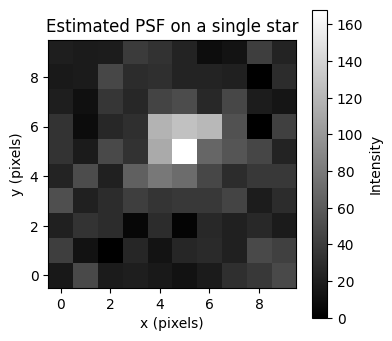

In [54]:
def estimate_psf_single_star(image, x, y, size=5):
    patch = extract_patch(image, x, y, size).astype(np.float32)
    return patch

i = 2      #0: perfect, 1: atmosphere, 2: little noise, 5: blur
coordinate = coordinates[i]
x0, y0 = coordinate[10]
print(f"Estimating PSF on image {i} at star position ({x0:.2f}, {y0:.2f})")
real_patch = extract_patch(images[i], x0, y0, size=10)
psf = estimate_psf_single_star(images[i], x0, y0, size=10)
print("Peak intensity:", psf.max())

#plot pfs 
plt.figure(figsize=(4,4))
plt.imshow(psf, cmap="gray", origin="lower")
plt.colorbar(label="Intensity")
plt.title("Estimated PSF on a single star")
plt.xlabel("x (pixels)")
plt.ylabel("y (pixels)")
plt.show()


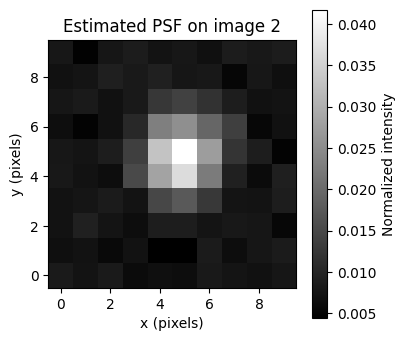

In [55]:
def estimate_psf_from_stars(image, stars, size=5):
    patches = extract_star_patches(image, stars, size)
    norm_patches = []

    for p in patches:
        p = p - p.min()
        if p.max() > 0:
            p = p / p.max()
            p = p / p.sum()
            norm_patches.append(p)

    psf = np.mean(norm_patches, axis=0)
    psf /= psf.sum()
    return psf

i = 2       #0: perfect, 1: atmosphere, 2: little noise, 5: blur
real_patch = extract_star_patches(images[i], coordinates[i], size=10)
psf = estimate_psf_from_stars(images[i], coordinates[i], size=10)

#plot pfs 
plt.figure(figsize=(4,4))
plt.imshow(psf, cmap='gray', origin='lower')
plt.colorbar(label="Normalized intensity")
plt.title(f"Estimated PSF on image {i}")
plt.xlabel("x (pixels)")
plt.ylabel("y (pixels)")
plt.show()

#### Real Star Patch vs Estimated PSF

To illustrate the difference between the ideal optical response and real image data, we compare a single real star patch extracted from the image with the estimated system PSF obtained by averaging multiple star patches.

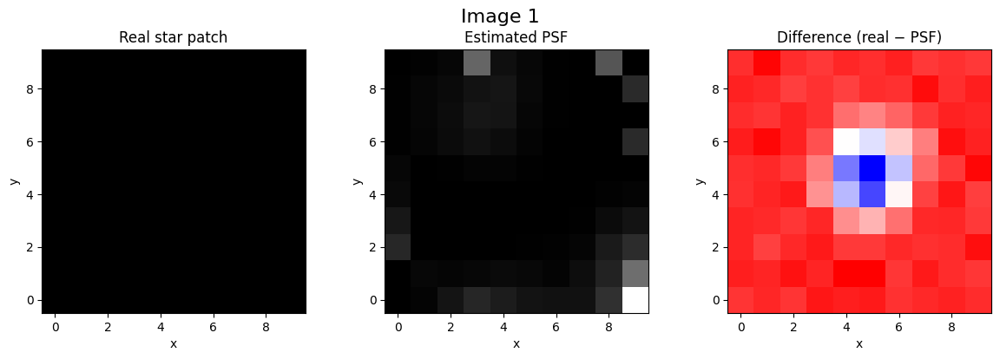

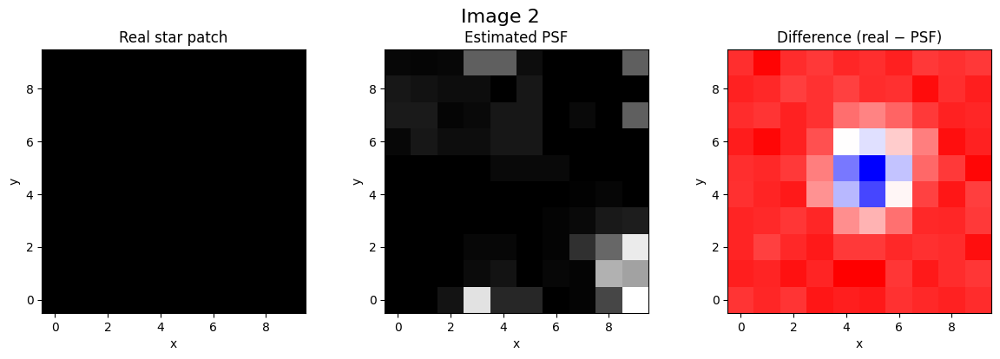

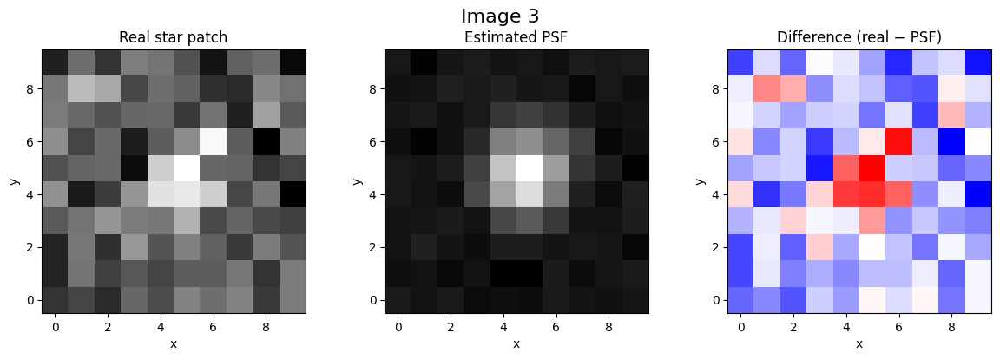

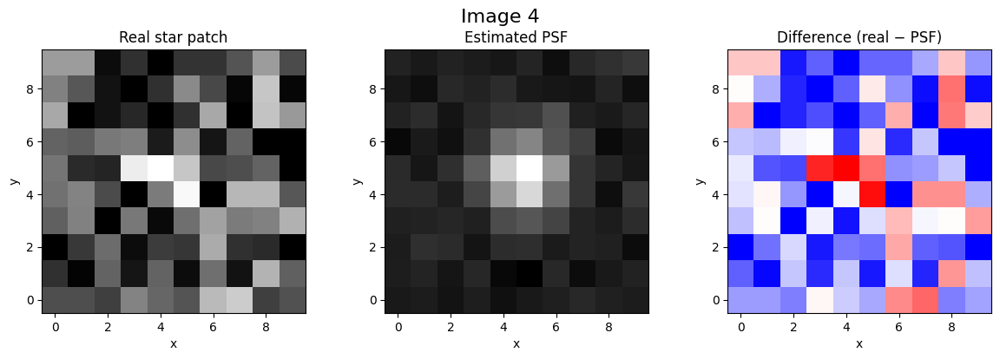

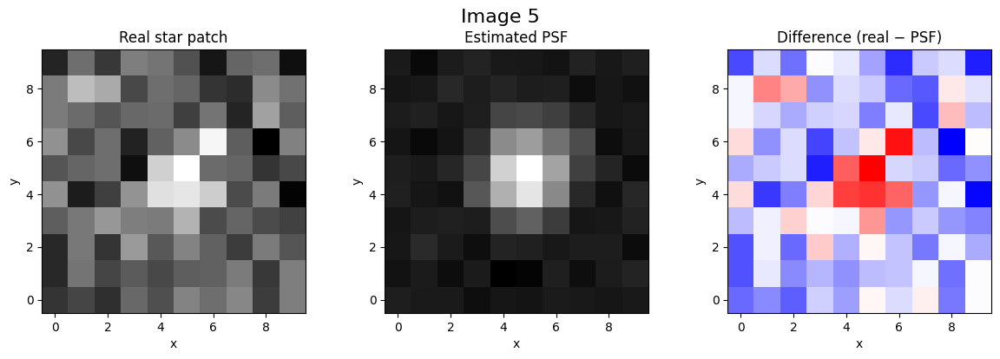

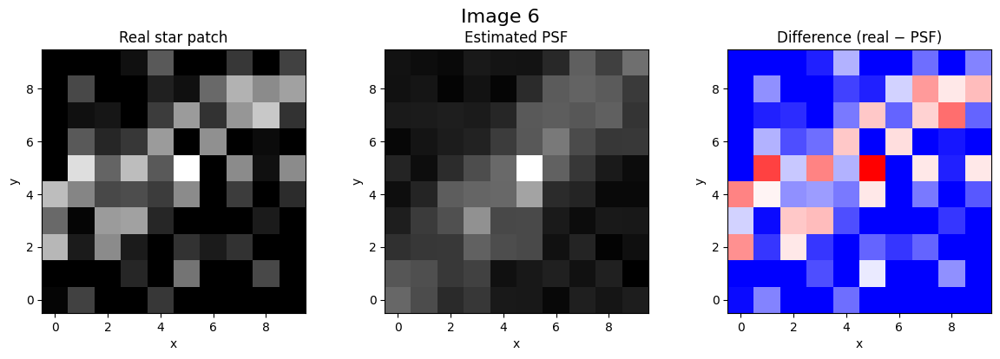

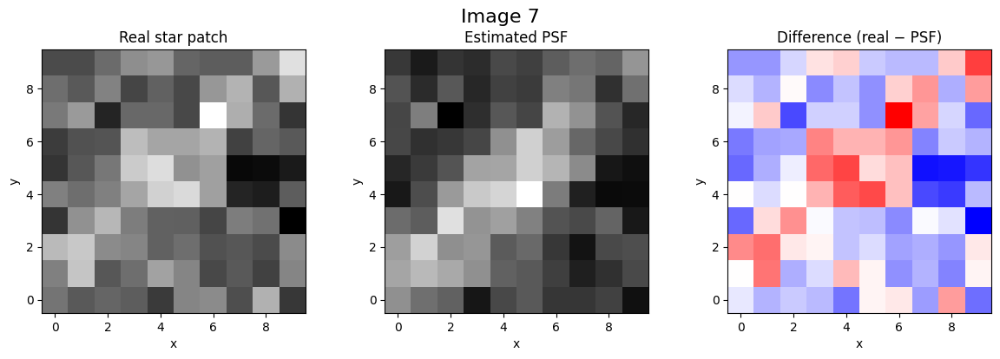

In [56]:
for i, img in enumerate(images):
    
    #variables
    coordinate = coordinates[i]
    x0, y0 = coordinate[0]    #arbitrary position
    size = 10
    
    #call to functions
    real_patch = extract_patch(img, x0, y0, size=size)
    psf_img = estimate_psf_from_stars(img, coordinate, size=size)
    
    #plot difference

    fig, axs = plt.subplots(1, 3, figsize=(12,4))
    fig.suptitle(f"Image {i+1}", fontsize=16)

    axs[0].imshow(real_patch, cmap='gray', origin='lower')
    axs[0].set_title("Real star patch")
    axs[0].set_xlabel("x")
    axs[0].set_ylabel("y")

    axs[1].imshow(psf_img, cmap='gray', origin='lower')
    axs[1].set_title("Estimated PSF")
    axs[1].set_xlabel("x")
    axs[1].set_ylabel("y")

    axs[2].imshow(real_patch - psf, cmap='bwr', origin='lower')
    axs[2].set_title("Difference (real − PSF)")
    axs[2].set_xlabel("x")
    axs[2].set_ylabel("y")

    plt.tight_layout()
    plt.show()

While the PSF exhibits a smooth and symmetric distribution, the real star patch is affected by background noise, stray light, and local intensity distortions introduced during preprocessing. These effects shift the energy distribution away from the true center and motivate the need for local compensation before centroid estimation.

In the first two nearly perfect, noiseless images, the PSFs are unusual: most of the window is dark and only a few pixels at the edges carry intensity. This happens because the images are very clean and symmetric, so there is almost no sub-pixel information to extract. In such cases, centroid calculation reproduces the overall star position but cannot detect meaningful sub-pixel shifts.

#### Local Compensation

Local compensation is a technique used to reduce the effect of noise and local intensity variations on star centroid estimation. It adjusts the gray values of the pixels in a small neighborhood around the central pixel, slightly lowering the brightest pixels and raising the darkest ones, which helps to better locate the true center of the star.

$$
\begin{cases}
G'_8 = G_8 - G_{Var} \\
G'_7 = G_7 - G_{Var} \\
G'_2 = G_2 + G_{Var} \\
G'_1 = G_1 + G_{Var}
\end{cases}
$$

Where $G_{Var}$ is the variance of the neighborhood,  
$G_8, G_7$ are the maximum and sub-maximum gray values,  
$G_1, G_2$ are the minimum and sub-minimum gray values.


In [57]:
def energy_compensation(patch):
 
    flat = patch.astype(np.float32).flatten()
    idx = np.argsort(flat)

    #variables
    G = flat[idx]
    G_var = np.var(G)
    n = len(G)
    
    # compensation
    num_extremes = max(1, n // 4)  # 25% extreme values
    G[:num_extremes] += G_var
    G[-num_extremes:] -= G_var

    compensated = np.zeros_like(flat)
    compensated[idx] = G
    return compensated.reshape(patch.shape)

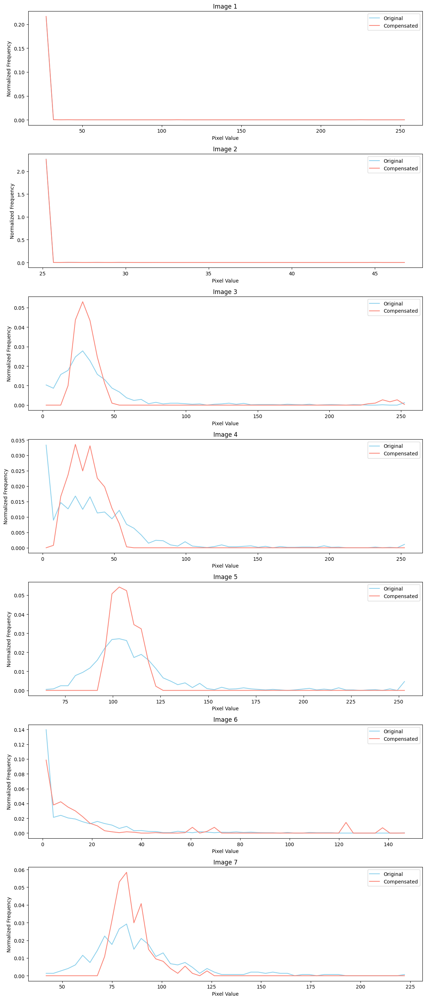

In [58]:
size = 10
n_imgs = len(images)
ncols = 1
nrows = int(np.ceil(n_imgs / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 4*nrows))
axes = axes.flatten()

for i, img in enumerate(images):
    patches = extract_star_patches(img, coordinates[i], size=size)
    
    all_pixels = np.concatenate([patch.flatten() for patch in patches])
    all_pixels_comp = np.concatenate([energy_compensation(patch).flatten() for patch in patches])
    
    counts_orig, bins = np.histogram(all_pixels, bins=50, density=True)
    counts_comp, _ = np.histogram(all_pixels_comp, bins=bins, density=True)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])

    ax = axes[i]
    ax.plot(bin_centers, counts_orig, label='Original', color='skyblue')
    ax.plot(bin_centers, counts_comp, label='Compensated', color='salmon')
    ax.set_title(f'Image {i+1}')
    ax.set_xlabel('Pixel Value')
    ax.set_ylabel('Normalized Frequency')
    ax.legend()

# spegne eventuali subplot vuoti
for j in range(i+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

    

As discussed earlier, the first two images show a sharp peak in the compensated profile up to about 25 pixel intensity, then drop to zero, while the original frequency is barely visible. In contrast, the noisier images display a broader, more variable original frequency, the compensated frequency is narrower, centered on the original, but with higher intensity.  

This is a positive outcome: the compensation effectively concentrates the star signal, reducing the spread caused by noise and blur, which enhances centroid accuracy and makes the detected peaks more reliable.

#### Star Point Centroid Localization

Mathematically, the star intensity can be expressed as a 2D Gaussian:

$$
I(x, y) = \frac{I_0}{2\pi\sigma_\text{psf}^2} \exp \left[-\frac{(x-x_c)^2 + (y-y_c)^2}{2\sigma_\text{psf}^2}\right]
$$

where $I_0$ is the total energy received, $(x_c, y_c)$ are the true coordinates of the star center, and $\sigma_\text{psf}$ is the spread of the PSF, indicating how concentrated the star's energy is.

To estimate the star center from the image, we use a **weighted centroid approach** with a threshold.  
In practice, this is implemented by extracting a small patch around the star, applying a local energy compensation to reduce noise influence, and computing the centroid only on pixels above a chosen threshold.  

In [59]:
def threshold_centroid(patch, x1, y1, T=0):
    h, w = patch.shape
    yy, xx = np.mgrid[0:h, 0:w]
    
    #weight computed for each pixel
    weights = patch - T
    weights[weights < 0] = 0
    if np.sum(weights) == 0:
        return None
    
    #weighted centroid calculation
    xc = np.sum((xx + x1) * weights) / np.sum(weights)
    yc = np.sum((yy + y1) * weights) / np.sum(weights)
    
    return xc, yc

In [66]:
#variables
percent = 0.2
window = 5
half = window // 2
centroids = []

for i, img in enumerate(images):
    
    centroid = []
    coordinate = coordinates[i]
    patches = extract_star_patches(img, coordinate, size=window)
    
    for j, patch in enumerate(patches):
        
        #compensation
        patch_comp = energy_compensation(patch)
        x, y = coordinate[j]

        #local threshold
        T = patch_comp.min() + percent * (patch_comp.max() - patch_comp.min())

        #Star Point Centroid Localization
        c = threshold_centroid(patch_comp, x - half, y - half, T=T)
        if c is None:
            continue
        centroid.append(c)
        
    centroids.append(centroid)

Once the centroids are computed, we proceed to verify their accuracy by comparing them with the reference centroids obtained through LOST.

In [61]:
def load_ground_truth(csv_file):
    coords = []
    with open(csv_file, "r") as f:
        for line in f:
            if line.startswith("num_input_centroids"):
                continue
            parts = line.split()
            key = parts[0]
            value = float(parts[1])
            if "_x" in key or "_y" in key:
                coords.append(value)

    xy_coords = [(coords[i], coords[i+1]) for i in range(0, len(coords), 2)]
    return xy_coords

gt_file = os.path.join(image_path, f"centroid.csv")
stars_perfect = load_ground_truth(gt_file)

To evaluate performance, we compare the estimated centroid coordinates with the ground truth positions and compute the localization error as the Euclidean distance between the two. This scalar metric allows us to directly compare different configurations.

In [62]:
def match_with_ground_truth(detected_array, gt_array, max_distance=3):
    distances = cdist(detected_array, gt_array)
    matched_gt = set()
    tp = 0

    for i in range(len(detected_array)):
        j = np.argmin(distances[i])
        if distances[i, j] <= max_distance and j not in matched_gt:
            tp += 1
            matched_gt.add(j)

    fp = len(detected_array) - tp
    fn = len(gt_array) - tp
    return tp, fp, fn

def compute_subpixel_error(detected_array, gt_array):
    errors = []
    for (x, y) in detected_array:
        #neare  st ground truth star
        dists = [np.hypot(x - xt, y - yt) for (xt, yt) in gt_array]
        errors.append(min(dists))
    return np.array(errors)

In [67]:
print("="*60)
print("CENTROID ACCURACY EVALUATION")
print("="*60)
print(f"{'Image':<10}{'Mean Err (px)':<15}{'Std Err (px)':<15}{'Max Err (px)':<15}{'Stars'}")
print("-"*60)

for i, centroid in enumerate(centroids):

    errors = compute_subpixel_error(centroid, stars_perfect)

    print(f"{i:<10}"
          f"{np.mean(errors):<15.4f}"
          f"{np.std(errors):<15.4f}"
          f"{np.max(errors):<15.4f}"
          f"{len(centroid):<6}")

print("="*60)

CENTROID ACCURACY EVALUATION
Image     Mean Err (px)  Std Err (px)   Max Err (px)   Stars
------------------------------------------------------------
0         16.6004        20.4261        95.7289        298   
1         16.4879        20.7727        95.0159        297   
2         1.5731         0.7301         3.0643         22    
3         10.1838        18.8959        74.9994        25    
4         1.6025         0.7692         3.0613         19    
5         6.3638         9.6794         38.5184        21    
6         4.3692         1.4819         6.2610         4     


In [68]:
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=3")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=3)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")

print("\n")
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=5")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=5)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")


GROUND TRUTH MATCHING RESULTS with max_distance=3
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         110       188       83        0.3691      0.5699    
1         164       133       29        0.5522      0.8497    
2         9         13        184       0.4091      0.0466    
3         7         18        186       0.2800      0.0363    
4         9         10        184       0.4737      0.0466    
5         4         17        189       0.1905      0.0207    
6         1         3         192       0.2500      0.0052    


GROUND TRUTH MATCHING RESULTS with max_distance=5
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         181       117       12        0.6074      0.9378    
1         179       118       14        0.6027      0.9275    
2         10        12        183       0.4545      0.0518    


Since the centroid estimate still depends strongly on the initial window selection, we then test an iterative refinement strategy. Starting from an initial centroid estimate, the computation is repeated using progressively smaller windows centered on the previous result.

The intuition is that pixels farther from the true star center are more likely to belong to the background or neighboring objects, and excluding them iteratively should improve convergence toward the actual intensity peak.

In [ ]:
#variables
percent_2 = 0.95
window = 5
window_s = 3
half = window // 2
half_s = window_s // 2
centroids = []

for i, img in enumerate(images):
    
    centroid = []
    coordinate = coordinates[i]
    patches = extract_star_patches(img, coordinate, size=window)
    
    for j, patch in enumerate(patches):

        x, y = coordinate[j]
        
        #compensation
        patch_comp = energy_compensation(patch)

        #local threshold
        T = patch_comp.min()

        #Star Point Centroid Localization
        c = threshold_centroid(patch_comp, x - half, y - half, T=T)
        if c is None:
            continue
        
        patch_comp = extract_patch(img, x, y, size=window_s)
        #patch_comp = energy_compensation(patchS)
        T_small = patch_comp.min() + percent_2 * (patch_comp.max() - patch_comp.min())
        c_small = threshold_centroid(patch_comp, c[0] - half_s, c[1] - half_s, T=T_small)
        if c_small is None:
            centroid.append(c)
        else:
            centroid.append(c_small)
        
    centroids.append(centroid)

We tested several combinations of window sizes and parameter settings. In particular, the values 5 and 3 — suggested in the reference paper — were confirmed to be effective in our experiments as well. We also observed that smaller windows benefit from a stronger intensity threshold, which helps suppress background noise while preserving centroid stability.

In [70]:
print("="*60)
print("CENTROID ACCURACY EVALUATION")
print("="*60)
print(f"{'Image':<10}{'Mean Err (px)':<15}{'Std Err (px)':<15}{'Max Err (px)':<15}{'Stars'}")
print("-"*60)

for i, centroid in enumerate(centroids):

    errors = compute_subpixel_error(centroid, stars_perfect)

    print(f"{i:<10}"
          f"{np.mean(errors):<15.4f}"
          f"{np.std(errors):<15.4f}"
          f"{np.max(errors):<15.4f}"
          f"{len(centroid):<6}")

print("="*60)

CENTROID ACCURACY EVALUATION
Image     Mean Err (px)  Std Err (px)   Max Err (px)   Stars
------------------------------------------------------------
0         16.5420        20.4660        95.7498        298   
1         16.4115        20.8260        95.0988        297   
2         1.8376         0.5899         2.9755         22    
3         10.4666        19.0413        75.8864        25    
4         1.9550         0.6446         3.2482         19    
5         6.3889         9.8377         39.2879        21    
6         3.9298         1.4642         5.4013         4     


The results remain largely consistent with the previous matching analysis. High errors in some images are mainly caused by false positives (spurious stars), which inflate the mean and standard deviation and distort the statistics.  

In [71]:
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=3")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=3)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")

print("\n")
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=5")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=5)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")


GROUND TRUTH MATCHING RESULTS with max_distance=3
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         120       178       73        0.4027      0.6218    
1         171       126       22        0.5758      0.8860    
2         10        12        183       0.4545      0.0518    
3         8         17        185       0.3200      0.0415    
4         9         10        184       0.4737      0.0466    
5         4         17        189       0.1905      0.0207    
6         2         2         191       0.5000      0.0104    


GROUND TRUTH MATCHING RESULTS with max_distance=5
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         181       117       12        0.6074      0.9378    
1         179       118       14        0.6027      0.9275    
2         10        12        183       0.4545      0.0518    


Comparing with the previous algorithm, using `max_distance=5` produces almost identical results, indicating that the set of detected stars remains the same.  

However, with `max_distance=3`, the current algorithm shows improved precision, suggesting that it localizes the stars more accurately while still detecting the same objects.

##### duplicated coordinates
During the analysis, we observed that moving stars are sometimes detected multiple times across nearby frames, producing several centroid estimates that correspond to the same physical object. As a result, these appear as duplicated or clustered coordinate values in the output files.

To avoid biasing the statistics with repeated measurements of the same star, we merge these nearby detections into a single representative coordinate. This consolidation step ensures that each physical star contributes only once to the error analysis, while still preserving the overall spatial distribution of the detections.

In [72]:
#variables
percent = 0.9
window = 5
window_s = 3
half = window // 2
half_s = window_s // 2
centroids = []

for i, img in enumerate(images):
    
    centroid = []
    coordinate = coordinates[i]
    patches = extract_star_patches(img, coordinate, size=window)
    
    for j, patch in enumerate(patches):

        x, y = coordinate[j]
        
        #compensation
        patch_comp = energy_compensation(patch)

        #local threshold
        T = patch_comp.min()

        #Star Point Centroid Localization
        c = threshold_centroid(patch_comp, x - half, y - half, T=T)
        if c is None:
            continue
        
        # optional: raffinamento locale su patch piccola
        patch_comp = extract_patch(img, x, y, size=window_s)
        #patch_comp = energy_compensation(patchS)
        T_small = patch_comp.min() + percent * (patch_comp.max() - patch_comp.min())
        c_small = threshold_centroid(patch_comp, c[0] - half_s, c[1] - half_s, T=T_small)
        if c_small is None:
            centroid.append(c)
        else:
            centroid.append(c_small)

    final = []
    used = set()
    for i in range(len(centroid)):
        if i in used:
            continue
        xi, yi = centroid[i]
        cluster = [(xi, yi)]
        used.add(i)
        for j in range(i+1, len(centroid)):
            if j in used:
                continue
            xj, yj = centroid[j]
            if np.hypot(xi-xj, yi-yj) < 3:  # distanza soglia per unire
                cluster.append((xj, yj))
                used.add(j)
        xs, ys = zip(*cluster)
        final.append((np.mean(xs), np.mean(ys)))

    centroids.append(final)

In [75]:
print("="*60)
print("CENTROID ACCURACY EVALUATION")
print("="*60)
print(f"{'Image':<10}{'Mean Err (px)':<15}{'Std Err (px)':<15}{'Max Err (px)':<15}{'Stars'}")
print("-"*60)

for i, centroid in enumerate(centroids):

    errors = compute_subpixel_error(centroid, stars_perfect)

    print(f"{i:<10}"
          f"{np.mean(errors):<15.4f}"
          f"{np.std(errors):<15.4f}"
          f"{np.max(errors):<15.4f}"
          f"{len(centroid):<6}")

print("="*60)

CENTROID ACCURACY EVALUATION
Image     Mean Err (px)  Std Err (px)   Max Err (px)   Stars
------------------------------------------------------------
0         16.5446        20.4639        95.7498        298   
1         16.4115        20.8260        95.0988        297   
2         1.8645         0.5853         2.9755         10    
3         15.9964        22.8833        75.5557        15    
4         1.9526         0.6260         3.2482         10    
5         9.0038         12.2180        39.2879        12    
6         3.9398         1.4575         5.4013         4     


From the table, we can see that the number of stars effectively decreases after this consolidation step. This is expected, since multiple detections corresponding to the same moving star are merged into a single representative coordinate.

In [76]:
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=3")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=3)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")

print("\n")
print("="*70)
print("GROUND TRUTH MATCHING RESULTS with max_distance=5")
print("="*70)
print(f"{'Image':<10}{'TP':<10}{'FP':<10}{'FN':<10}{'Precision':<12}{'Recall':<10}")
print("-"*70)

for i, centroid in enumerate(centroids):
    tp, fp, fn = match_with_ground_truth(centroid, stars_perfect, max_distance=5)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    print(f"{i:<10}"
          f"{tp:<10}"
          f"{fp:<10}"
          f"{fn:<10}"
          f"{precision:<12.4f}"
          f"{recall:<10.4f}")


GROUND TRUTH MATCHING RESULTS with max_distance=3
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         120       178       73        0.4027      0.6218    
1         171       126       22        0.5758      0.8860    
2         10        0         183       1.0000      0.0518    
3         8         7         185       0.5333      0.0415    
4         9         1         184       0.9000      0.0466    
5         4         8         189       0.3333      0.0207    
6         2         2         191       0.5000      0.0104    


GROUND TRUTH MATCHING RESULTS with max_distance=5
Image     TP        FP        FN        Precision   Recall    
----------------------------------------------------------------------
0         181       117       12        0.6074      0.9378    
1         179       118       14        0.6027      0.9275    
2         10        0         183       1.0000      0.0518    


For **Images 0 and 1**, the matching is almost entirely correct. The relatively high number of false positives is due to the detection of many additional stars in the vicinity of the true coordinates, however, the true positives are highly accurate.  

Images with **low noise and blur** (e.g., Images 2 and 4) show perfect precision, indicating that detected matches are correct, though the recall is low because many true stars are missed.  

Conversely, images with **high noise and blur** (e.g., Images 3, 5, and 6) show significantly lower precision and recall, meaning that roughly half of the matches are correct, and many true stars are not detected. 

# Chapter 3: Final statistics and comparison

To compute these statistics, we first ran the full processing pipeline on the dataset to generate the output CSV files. The standard pipeline produces the files centroids.csv and coordinates.csv, while the LOST-based pipeline generates LOSTcentroids.csv and LOSTcoordinates.csv. For a matter of convenience we have saved them in a zipped repository. 

#### Dataset Generation

The dataset consists of synthetic star-field images generated by varying sky positions, noise levels, and observational effects. Each image contains stars that are always visible to the naked eye, while different combinations of noise, blur, and dark current simulate realistic conditions.

Images are named using a three-letter prefix to indicate a unique sky position (defined by RA, DEC, and ROLL) and a trailing digit to encode the noise level:

- `0` → perfect (noise-free) image  
- `1` → atmosphere only  
- `2` → low noise  
- `3` → higher noise  
- `4` → dark current  
- `5` → blur only  
- `6` → blur + dark current

For example, `AAA0` and `AAA1` correspond to the same sky position under different noise conditions. This naming scheme allows up to 26³ unique sky positions.

For each image, the centroid coordinates of all stars are saved in `dataset/centroid/centroid_<IMAGE_ID>.csv`, enabling ground truth comparison.

To generate the dataset from the repository, navigate to the dataset generator folder, set execution permissions, and run the generator script:

```bash
cd ../dataset_generator
chmod +x images_generator.sh
./images_generator.sh


#### Processing Pipelines

Once the dataset is generated, the images are processed to compute star coordinates and centroids. Two pipelines are available:

- **Standard pipeline:**  
  For each image, the pipeline performs preprocessing and centroid calculation as follows:  

  1. Load images: each image is read from the dataset and converted to grayscale.  
    2. Classify images: based on estimated noise and blur levels, images are categorized.  
    3. Star detection: coordinates are computed using one of the methods described earlier in the notebook, depending on the image category. 
    4. Centroid calculation: centroids are refined using the previously described algorithm, which applies thresholding, adaptive windowing, and robust compensation to compute accurate sub-pixel positions.  
    5. Save results: for each image, coordinates and centroids are saved to `coordinates.csv` and `centroids.csv`. 

- **LOST-based pipeline:**  
  This pipeline applies the functions introduced earlier in the notebook, for each image, coordinates and centroids are computed using LOST-specific functions and saved to `LOSTcoordinates.csv` and `LOSTcentroids.csv`.  



To run the pipelines, execute the following commands:

```bash
python3 pipeline.py
python3 lost_pipeline.py
```

**Notes:**

- The pipelines automatically download the online dataset if not present locally.
- To process a locally generated dataset instead, comment out the automatic download function; otherwise, the downloaded dataset will overwrite your files.
- Make sure `utils.py` is present in the same folder as the pipeline scripts; the functions used in are implemented there.



We can now unzip the 'output' repository and check the results:

In [ ]:
import zipfile

with zipfile.ZipFile("output.zip", 'r') as zip_ref:
    zip_ref.extractall(".")   # "." = cartella corrente
print("The repository has been unzipped successfully.")

The repository has been unzipped successfully.


To compute the final statistics and be able to correctly compare the results we will use the reference parameters that we first used for our image examples

In [ ]:
#getting the path
path = os.getcwd()
base_path = os.path.join(path, "output", "output")


coord = utils.read_custom_csv(os.path.join(base_path, "coordinates.csv"))
LOSTcoord = utils.read_custom_csv(os.path.join(base_path, "LOSTcoordinates.csv"))
centroids = utils.read_custom_csv(os.path.join(base_path, "centroids.csv"))
LOSTcentroids = utils.read_custom_csv(os.path.join(base_path, "LOSTcentroids.csv"))

print("Files correctly loaded and ready to be processed")

coord_dict = {}
LOSTcoord_dict = {}
centroids_dict = {}
LOSTcentroids_dict = {}
groundtruth = None

#we have the same amount of elements in both coord and LOSTcoord
for key in LOSTcoord.keys():

    if key.endswith('0'):
        groundtruth = LOSTcoord[key]

    tp, fp, fn = utils.match_with_ground_truth(coord[key], groundtruth)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    coord_dict.setdefault(key[-1], []).extend([tp, fp, fn, precision, recall, f1])


    tp, fp, fn = utils.match_with_ground_truth(LOSTcoord[key], groundtruth)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    LOSTcoord_dict.setdefault(key[-1], []).extend([tp, fp, fn, precision, recall, f1])

print("number of categories analyzed:", len(coord_dict.keys()))
print("Categories:", coord_dict.keys())
print("\n=== Results ===\n")
for cat, values in coord_dict.items():
    n = len(values) // 6
    avg_values = [sum(values[i::6]) / n for i in range(6)]

    LOSTvalues = LOSTcoord_dict[cat]
    LOSTavg_values = [sum(LOSTvalues[i::6]) / n for i in range(6)]

    data = {
        'Our Method': [avg_values[0], avg_values[1], avg_values[2], f"{avg_values[3]:.2%}", f"{avg_values[4]:.2%}", f"{avg_values[5]:.2%}"],
        '  LOST Method': [LOSTavg_values[0], LOSTavg_values[1], LOSTavg_values[2], f"{LOSTavg_values[3]:.2%}", f"{LOSTavg_values[4]:.2%}", f"{LOSTavg_values[5]:.2%}"]
    }
    df = pd.DataFrame(data, index=['True Positives', 'False Positives', 'False Negatives', 'Precision', 'Recall', 'F1-Score'])
    print(f"\nCategory {cat}:")
    print(df.to_string())


Files correctly loaded and ready to be processed
number of categories analyzed: 7
Categories: dict_keys(['0', '1', '2', '3', '4', '5', '6'])

=== Results ===


Category 0:
                 Our Method   LOST Method
True Positives   354.770833       276.125
False Positives    2.520833           0.0
False Negatives   16.020833           0.0
Precision            99.12%       100.00%
Recall               94.44%       100.00%
F1-Score             96.70%       100.00%

Category 1:
                 Our Method   LOST Method
True Positives   258.020833       228.375
False Positives      0.6875      3.604167
False Negatives   18.104167     92.770833
Precision            99.72%        98.45%
Recall               93.47%        70.53%
F1-Score             96.49%        81.22%

Category 2:
                 Our Method   LOST Method
True Positives    22.208333     10.916667
False Positives      0.5625      0.041667
False Negatives  266.083333       265.625
Precision            97.71%        99.61%
Reca

The comparison highlights a clear trade-off between precision and recall. Our method consistently achieves higher precision and significantly reduces the number of false positives across most categories, particularly in highly noisy scenarios where LOST tends to over-detect stars. This behavior is consistent with the design goal of providing reliable star candidates for subsequent centroid localization, where an excess of false positives can severely degrade performance.

Please note that, when computing the statistics, all detections produced by LOST on the noise-free image (Image 0) were considered correct, since LOST generated this image and therefore achieves perfect accuracy under noise-free conditions. For this reason, LOST attains 100% precision and recall in the first two cases, both corresponding to the absence of noise.

This consideration must also be kept in mind when analyzing false negatives and, consequently, recall and F1-score in noisy images. As noise increases, not all stars present in the original reference image remain visible or detectable. However, the full set of reference stars was retained in the evaluation in order to provide an absolute performance measure, which naturally leads to lower recall and F1-score values under increasingly noisy conditions.

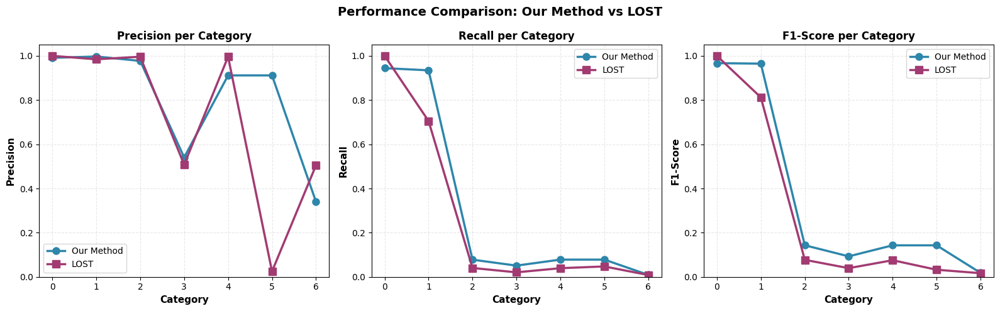

In [ ]:
# Preparazione dati per i grafici di performance
import matplotlib.pyplot as plt

# Raccogli i dati per categoria
categories_list = sorted(coord_dict.keys())
precision_our = []
precision_lost = []
recall_our = []
recall_lost = []
f1_our = []
f1_lost = []

for cat in categories_list:
    values_our = coord_dict[cat]
    n_our = len(values_our) // 6
    avg_our = [sum(values_our[i::6]) / n_our for i in range(6)]
    
    values_lost = LOSTcoord_dict[cat]
    n_lost = len(values_lost) // 6
    avg_lost = [sum(values_lost[i::6]) / n_lost for i in range(6)]
    
    precision_our.append(avg_our[3])
    precision_lost.append(avg_lost[3])
    recall_our.append(avg_our[4])
    recall_lost.append(avg_lost[4])
    f1_our.append(avg_our[5])
    f1_lost.append(avg_lost[5])

# Crea i tre grafici
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Performance Comparison: Our Method vs LOST', fontsize=14, fontweight='bold')

# Grafico 1: Precision
ax = axes[0]
x = np.arange(len(categories_list))
ax.plot(x, precision_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, precision_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('Precision', fontweight='bold', fontsize=11)
ax.set_title('Precision per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_ylim([0, 1.05])

# Grafico 2: Recall
ax = axes[1]
ax.plot(x, recall_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, recall_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('Recall', fontweight='bold', fontsize=11)
ax.set_title('Recall per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_ylim([0, 1.05])

# Grafico 3: F1-Score
ax = axes[2]
ax.plot(x, f1_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, f1_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('F1-Score', fontweight='bold', fontsize=11)
ax.set_title('F1-Score per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')
ax.set_ylim([0, 1.05])

plt.tight_layout()
plt.show()

### Precision Analysis

Precision is the primary metric of interest in this work, as the goal of the proposed pipeline is to provide reliable star candidates for the subsequent centroid localization stage. Across most categories, our method consistently achieves high precision, remaining above 90% even in highly noisy scenarios. In contrast, LOST shows optimal precision only in noise-free or mildly noisy conditions, while its performance degrades significantly in more challenging cases. Notably, in Category 5, LOST exhibits a dramatic increase in false positives, leading to a precision drop to 2.49%, whereas our method maintains stable and reliable behavior. These results indicate that the proposed approach is more effective in controlling false detections, which is crucial for preserving the robustness of the overall star tracking pipeline.

### Recall Analysis

Recall decreases for both methods as noise intensity increases, particularly in categories characterized by severe degradation. This behavior is expected, since the ground truth includes stars that are no longer visible or distinguishable in noisy images. Within this context, our method generally achieves recall values comparable to or higher than those of LOST across most categories. However, recall is not the primary optimization target of this work, as attempting to maximize star recovery under extreme noise conditions would inevitably lead to a significant increase in false positives, negatively impacting downstream processing stages.

### F1-Score Analysis

The F1-score reflects the combined effect of precision and recall and is therefore strongly influenced by recall degradation in noisy scenarios. As a consequence, low F1-score values are observed in both methods for highly degraded images. Nevertheless, our method consistently attains higher F1-scores than LOST in most categories, indicating a more balanced trade-off between reliable detections and star recovery. This behavior further confirms the robustness of the proposed pipeline under non-ideal imaging conditions.

Overall, LOST performs optimally only in ideal, noise-free conditions, where it achieves perfect accuracy due to the nature of image generation. In contrast, the proposed method demonstrates greater robustness across a wider range of noise conditions, maintaining high precision and effectively limiting false positives. From a precision-oriented perspective, which is particularly relevant for centroid localization and star matching, the proposed approach improves upon LOST and provides a more stable and reliable input for subsequent processing stages.

## Centroid Localization Statistics

In [ ]:
groundtruth = None

#stessa quantità di elementi in LOSTcoord e coord
for key in LOSTcentroids.keys():

    if key.endswith('0'):
        groundtruth = LOSTcentroids[key]

    matches, n_matched, match_ratio = utils.match_centroids(groundtruth, LOSTcentroids[key], threshold=30.0)
    relative_ratio = n_matched / len(LOSTcentroids[key]) if len(LOSTcentroids[key]) > 0 else 0.0

    LOSTcentroids_dict.setdefault(key[-1], []).extend([n_matched, match_ratio, relative_ratio*100.0])

    matches, n_matched, match_ratio = utils.match_centroids(groundtruth, centroids[key], threshold=30.0)
    relative_ratio = n_matched / len(centroids[key]) if len(centroids[key]) > 0 else 0.0

    centroids_dict.setdefault(key[-1], []).extend([n_matched, match_ratio, relative_ratio*100.0])


print("number of categories analyzed:", len(LOSTcentroids_dict.keys()))
print("Categories:", LOSTcentroids_dict.keys())
print("\n=== Results ===\n")
for cat, values in centroids_dict.items():
    n = len(values) // 6
    avg_values = [sum(values[i::6]) / n for i in range(6)]

    LOSTvalues = LOSTcentroids_dict[cat]
    LOSTavg_values = [sum(LOSTvalues[i::6]) / n for i in range(6)]

    data = {
        'Our Method': [avg_values[0], avg_values[1], avg_values[2]],
        '  LOST Method': [LOSTavg_values[0], LOSTavg_values[1], LOSTavg_values[2]]
    }
    df = pd.DataFrame(data, index=['Number of matches', 'Match Ratio', 'Relative Ratio'])
    print(f"\nCategory {cat}:")
    print(df.to_string())


number of categories analyzed: 7
Categories: dict_keys(['0', '1', '2', '3', '4', '5', '6'])

=== Results ===


Category 0:
                   Our Method    LOST Method
Number of matches  266.416667        279.375
Match Ratio         95.229914        100.000
Relative Ratio      25.750000         25.750

Category 1:
                   Our Method    LOST Method
Number of matches  262.041667     241.875000
Match Ratio         93.783561      86.664432
Relative Ratio      25.750000      25.677447

Category 2:
                   Our Method    LOST Method
Number of matches   10.125000      10.916667
Match Ratio          3.680147       3.984604
Relative Ratio      25.417907      25.630787

Category 3:
                   Our Method    LOST Method
Number of matches   11.833333       7.916667
Match Ratio          4.275211       2.829950
Relative Ratio      16.852333      19.192957

Category 4:
                   Our Method    LOST Method
Number of matches   11.125000      10.500000
Match Ratio    

The localization performance of the two methods is evaluated using three metrics: the number of matches, the match ratio, and the relative ratio. The match ratio represents the percentage of correctly localized centroids with respect to the total number of reference stars in the image, providing an absolute measure of localization accuracy. Conversely, the relative ratio evaluates the percentage of correct centroids with respect to the total number of detected stars, thus measuring how reliable the detected candidates are.

The match ratio highlights the expected degradation of absolute localization performance as noise increases, affecting both methods. However, the relative ratio provides a more meaningful insight into the reliability of the detected centroids. From this perspective, the proposed method demonstrates greater robustness, particularly in highly noisy scenarios, by maintaining stable relative ratios and avoiding the uncontrolled growth of false detections observed in LOST.

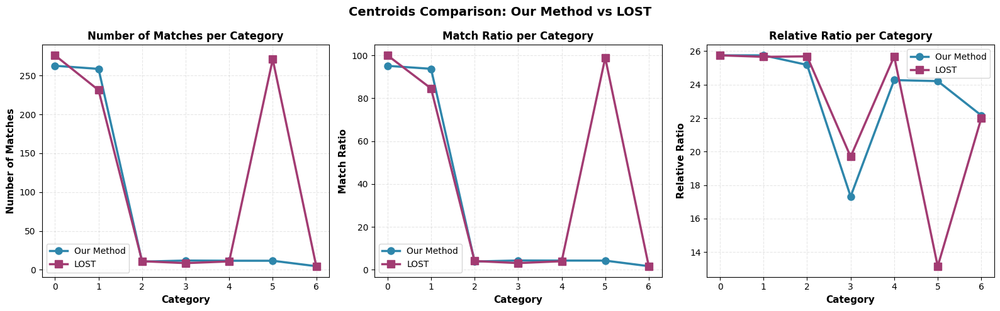

In [ ]:
import matplotlib.pyplot as plt

categories_list = sorted(centroids_dict.keys())
matches_our = []
matches_lost = []
ratio_our = []
ratio_lost = []
relative_our = []
relative_lost = []

for cat in categories_list:
    values_our = centroids_dict[cat]
    n_our = len(values_our) // 3
    avg_our = [sum(values_our[i::3]) / n_our for i in range(3)]
    
    values_lost = LOSTcentroids_dict[cat]
    n_lost = len(values_lost) // 3
    avg_lost = [sum(values_lost[i::3]) / n_lost for i in range(3)]
    
    matches_our.append(avg_our[0])
    matches_lost.append(avg_lost[0])
    ratio_our.append(avg_our[1])
    ratio_lost.append(avg_lost[1])
    relative_our.append(avg_our[2])
    relative_lost.append(avg_lost[2])

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Centroids Comparison: Our Method vs LOST', fontsize=14, fontweight='bold')

ax = axes[0]
x = np.arange(len(categories_list))
ax.plot(x, matches_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, matches_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('Number of Matches', fontweight='bold', fontsize=11)
ax.set_title('Number of Matches per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')

ax = axes[1]
ax.plot(x, ratio_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, ratio_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('Match Ratio', fontweight='bold', fontsize=11)
ax.set_title('Match Ratio per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')

ax = axes[2]
ax.plot(x, relative_our, marker='o', linewidth=2.5, markersize=8, label='Our Method', color='#2E86AB')
ax.plot(x, relative_lost, marker='s', linewidth=2.5, markersize=8, label='LOST', color='#A23B72')
ax.set_xlabel('Category', fontweight='bold', fontsize=11)
ax.set_ylabel('Relative Ratio', fontweight='bold', fontsize=11)
ax.set_title('Relative Ratio per Category', fontweight='bold', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(categories_list, fontsize=10)
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

### Number of Matches

The number of matches represents the absolute count of correctly localized star centroids and decreases for both methods as noise increases. In noise-free and low-noise conditions (Categories 0 and 1), LOST slightly outperforms our method due to its role in image generation. In moderately noisy scenarios (Categories 2–4), our method achieves comparable or higher numbers of correct matches, while in the most critical case (Category 5) LOST reports an unrealistically high number of matches caused by over-detection. In extreme noise conditions (Category 6), both methods show similarly low performance.

### Match Ratio

The match ratio measures the percentage of correct centroid localizations with respect to the total number of reference stars and therefore reflects absolute localization accuracy. As expected, this metric degrades significantly with increasing noise for both methods. While LOST achieves perfect performance in the absence of noise, our method generally provides equal or higher match ratios in noisy conditions, indicating improved robustness when star visibility is reduced.

### Relative Ratio

The relative ratio evaluates the proportion of correct centroids with respect to the detected stars and is a key indicator of detection reliability. Across most categories, our method maintains higher and more stable relative ratios, demonstrating effective control of false detections. In contrast, LOST exhibits a notable drop in relative ratio in challenging scenarios, particularly in Category 5, where excessive detections reduce localization reliability.

Overall, while LOST performs optimally only in ideal conditions, the proposed method demonstrates greater robustness in noisy environments. By maintaining stable numbers of matches and higher relative ratios, it provides a more reliable set of centroid candidates, making it better suited for integration into a complete and noise-tolerant star tracking pipeline.